In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import os
import matplotlib.pyplot as plt

In [2]:
#load data
train=pd.read_csv('C:/Users/jiema/Documents/data/Mnist/train.csv')
test=pd.read_csv('C:/Users/jiema/Documents/data/Mnist/test.csv')
train_data=train.iloc[:,1:].values
train_label=train.iloc[:,0].values
train_data=train_data/127.5-1.
train_data=np.reshape(train_data,(42000,28,28,1))

In [ ]:
'''##### Brief Intro ####
c: Noisy code - dim: 62
c1: discrete latent code [k=10,p=0.1]
c2, c3: continuous latent code Uniform (-1,1)

Adam as optimizer
Batch Normalization for most of layers
Leaky Relu (leak rate 0.1) for discriminator 
Relu for generator

Regards to discrete latent codes,softmax is applied to predict correct category
Regards to continuous latent codes, posterior through diagonal Gaussian distribution is used. Generator output mean and stddev.
stddev is parameterized through an exponential transform to ensure postivity

learning rate: D - 2e-4, G - 2e-4, Q - 2e-4 lamda = 1

# Model: DCGAN no more tricks introduced
D/Q:
input 28*28 image
4*4 conv 64 IRELU stride=2
4*4 conv 128 IRELU stride=2 BN
FC 1024 IRELU BN
FC for D
FC 128-BN-IRELU_FC output for Q

G:
Input 74 latent code
FC 1024 RELU BN
FC 7*7*128 RELU BN
4*4 upconv 64 RELU stride 2 BN
4*4 upconv 1 channel
'''

In [36]:
class InfoGan_withoutc:
    def __init__(self):
        self.X=tf.placeholder(dtype=tf.float32,shape=[None,28,28,1])
        self.Z=tf.placeholder(dtype=tf.float32,shape=[None,42])
        self.C=tf.placeholder(dtype=tf.float32,shape=[None,2])
        self.D=tf.placeholder(dtype=tf.float32,shape=[None,10])
        self.is_training_d=tf.placeholder(tf.bool,[])
        self.is_training_g=tf.placeholder(tf.bool,[])
        
    def Discriminator(self,x,reuse):
        with tf.variable_scope('discriminator',reuse=reuse):
            out1=tf.layers.conv2d(x,64,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_1')
            out1=self.lrelu(out1)
            out2=tf.layers.conv2d(out1,128,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='c_2')
            out2=tf.layers.batch_normalization(out2,training=self.is_training_d,name='n_2')
            out2=self.lrelu(out2)
            out3=tf.reshape(out2,(-1,7*7*128))
            out3=tf.layers.dense(out3,1024,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_3')
            out3=tf.layers.batch_normalization(out3,training=self.is_training_d,name='n_3')
            out3=self.lrelu(out3)
            with tf.variable_scope('Discriminator_output'):
                D_out=tf.layers.dense(out3,1,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='D_out')
                D_out=tf.nn.sigmoid(D_out)
            with tf.variable_scope('latent_code'):
                out4=tf.layers.dense(out3,128,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_4')
                out4=tf.layers.batch_normalization(out4,training=self.is_training_d,name='n_4')
                out4=self.lrelu(out4)
                #mean=tf.layers.dense(out4,2,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_mean')
                #log_std=tf.layers.dense(out4,2,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_stddev')
                discrete=tf.layers.dense(out4,10,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='discrete')
            #return D_out,discrete,mean,log_std
            return D_out,discrete
                
    def Generator(self,reuse):
        with tf.variable_scope('generator',reuse=reuse):
            latent=tf.concat([self.Z,self.D],1)
            out1=tf.layers.dense(latent,1024,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_1')
            out1=tf.layers.batch_normalization(out1,training=self.is_training_g,name='b_1')
            out1=tf.nn.relu(out1)
            out2=tf.layers.dense(out1,7*7*128,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_2')
            out2=tf.reshape(out2,[-1,7,7,128])
            out2=tf.layers.batch_normalization(out2,training=self.is_training_g,name='b_2')
            out2=tf.nn.relu(out2)
            out3=tf.layers.conv2d_transpose(out2,64,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='dc_3')
            out3=tf.layers.batch_normalization(out3,training=self.is_training_g,name='b_3')
            out3=tf.nn.relu(out3)
            out4=tf.layers.conv2d_transpose(out3,1,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='dc_4')
            final=tf.nn.tanh(out4)
            return final
    
    def cost(self):
        #d_true,_,_,_=self.Discriminator(self.X,False)
        d_true,_=self.Discriminator(self.X,False)
        self.fake_image=self.Generator(False)
        #d_gen,discrete,mean,log_std=self.Discriminator(self.fake_image,reuse=True)
        d_gen,discrete=self.Discriminator(self.fake_image,reuse=True)
        D_loss=-tf.reduce_mean(tf.log(d_true))-tf.reduce_mean(tf.log(1.-d_gen))
        G_loss=tf.reduce_mean(-tf.log(d_gen))
        #self.g_c_loss=tf.reduce_mean(tf.reduce_sum(log_std+0.5*tf.square((self.C-mean)/tf.exp(log_std)),reduction_indices=1))
        self.g_d_loss=tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=self.D,logits=discrete))
        self.mutual_info=self.g_d_loss
        self.g_loss=G_loss
        self.d_loss=D_loss
        
    def lrelu(self,x,leak=0.1):
        return tf.maximum(x,leak*x)

In [2]:
class InfoGan:
    def __init__(self):
        self.X=tf.placeholder(dtype=tf.float32,shape=[None,28,28,1])
        self.Z=tf.placeholder(dtype=tf.float32,shape=[None,62])
        self.C=tf.placeholder(dtype=tf.float32,shape=[None,2])
        self.D=tf.placeholder(dtype=tf.float32,shape=[None,10])
        self.is_training_d=tf.placeholder(tf.bool,[])
        self.is_training_g=tf.placeholder(tf.bool,[])
        
    def Discriminator(self,x,reuse):
        with tf.variable_scope('discriminator',reuse=reuse):
            out1=tf.layers.conv2d(x,64,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_1')
            out1=self.lrelu(out1)
            out2=tf.layers.conv2d(out1,128,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='c_2')
            out2=tf.layers.batch_normalization(out2,training=self.is_training_d,name='n_2')
            out2=self.lrelu(out2)
            out3=tf.reshape(out2,(-1,7*7*128))
            out3=tf.layers.dense(out3,1024,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_3')
            out3=tf.layers.batch_normalization(out3,training=self.is_training_d,name='n_3')
            out3=self.lrelu(out3)
            with tf.variable_scope('Discriminator_output'):
                D_out=tf.layers.dense(out3,1,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='D_out')
                D_out=tf.nn.sigmoid(D_out)
            with tf.variable_scope('latent_code'):
                out4=tf.layers.dense(out3,128,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_4')
                out4=tf.layers.batch_normalization(out4,training=self.is_training_d,name='n_4')
                out4=self.lrelu(out4)
                mean=tf.layers.dense(out4,2,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_mean')
                log_std=tf.layers.dense(out4,2,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='c_stddev')
                discrete=tf.layers.dense(out4,10,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='discrete')
            return D_out,discrete,mean,log_std
                
    def Generator(self,reuse):
        with tf.variable_scope('generator',reuse=reuse):
            latent=tf.concat([self.Z,self.D,self.C],1)
            out1=tf.layers.dense(latent,1024,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_1')
            out1=tf.layers.batch_normalization(out1,training=self.is_training_g,name='b_1')
            out1=tf.nn.relu(out1)
            out2=tf.layers.dense(out1,7*7*128,kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='f_2')
            out2=tf.reshape(out2,[-1,7,7,128])
            out2=tf.layers.batch_normalization(out2,training=self.is_training_g,name='b_2')
            out2=tf.nn.relu(out2)
            out3=tf.layers.conv2d_transpose(out2,64,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),use_bias=False,name='dc_3')
            out3=tf.layers.batch_normalization(out3,training=self.is_training_g,name='b_3')
            out3=tf.nn.relu(out3)
            out4=tf.layers.conv2d_transpose(out3,1,4,2,padding='SAME',kernel_initializer=tf.random_normal_initializer(0,stddev=0.02),name='dc_4')
            final=tf.nn.tanh(out4)
            return final
    
    def cost(self):
        d_true,_,_,_=self.Discriminator(self.X,False)
        self.fake_image=self.Generator(False)
        d_gen,discrete,mean,log_std=self.Discriminator(self.fake_image,reuse=True)
        D_loss=-tf.reduce_mean(tf.log(d_true))-tf.reduce_mean(tf.log(1.-d_gen))
        G_loss=tf.reduce_mean(-tf.log(d_gen))
        self.g_c_loss=tf.reduce_mean(tf.reduce_sum(log_std+0.5*tf.square((self.C-mean)/tf.exp(log_std)),reduction_indices=1))
        self.g_d_loss=tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=self.D,logits=discrete))
        self.mutual_info=self.g_d_loss+self.g_c_loss
        self.g_loss=G_loss
        self.d_loss=D_loss
        
    def lrelu(self,x,leak=0.1):
        return tf.maximum(x,leak*x)

In [3]:
#generate latent codes
def sample(size):
    z=np.random.uniform(-1,1,size=(size,62))
    c=np.random.uniform(-1,1,size=(size,2))
    d=np.zeros((size,10))
    idx=np.random.randint(0,10,size=size)
    d[np.arange(size),idx]=1
    return z,c,d

In [5]:
#shuffle the training data
def shuffle(x):
    indice=np.random.permutation(len(x))
    return x[indice]

In [6]:
def train(data,batch_size):
    model=InfoGan()
    model.cost()
    var_list=tf.trainable_variables()
    D_var=[var for var in var_list if 'discriminator' in var.name and 'latent_code' not in var.name]
    G_var=[var for var in var_list if 'generator' in var.name]
    m1_var=[var for var in var_list if 'discriminator' in var.name and 'Discriminator_output' not in var.name]
    m_var=m1_var+G_var
    op_d=tf.train.AdamOptimizer(2e-4)
    op_g=tf.train.AdamOptimizer(2e-4)
    op_m=tf.train.AdamOptimizer(2e-4)
    saver=tf.train.Saver(tf.global_variables())
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(update_ops):
        op_D=op_d.minimize(model.d_loss,var_list=D_var)
        op_G=op_g.minimize(model.g_loss,var_list=G_var)
        op_M=op_m.minimize(model.mutual_info,var_list=m_var)
    step=len(data)//batch_size
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for i in range(100):
            x=shuffle(data)
            for j in range(step):
                z,c,d=sample(batch_size)
                _,curr_dloss=sess.run([op_D,model.d_loss],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
                z,c,d=sample(batch_size)
                _,curr_gloss,curr_image=sess.run([op_G,model.g_loss,model.fake_image],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
                z,c,d=sample(batch_size)
                _,curr_mloss,curr_closs,curr_dloss=sess.run([op_M,model.mutual_info,model.g_c_loss,model.g_d_loss],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
               
                '''
                z,c,d=sample(batch_size)
                _,curr_dloss=sess.run([op_D,model.d_loss],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
                z,c,d=sample(batch_size)
                _,curr_gloss,curr_image=sess.run([op_G,model.g_loss,model.fake_image],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
                z,c,d=sample(batch_size)
                _,curr_mloss=sess.run([op_M,model.mutual_info],feed_dict={model.X:x[j*batch_size:(j+1)*batch_size],model.Z:z,model.C:c,model.D:d,model.is_training_d:True,model.is_training_g:True})
               '''
                if j%1000==0:
                    print('### Epoch {}, Step {} ###'.format(i,j))
                    print('Current D_loss: {}, Current G_loss: {}, current_mutual: {}, current c loss: {}, curr d loss: {}\n'.format(curr_dloss,curr_gloss,curr_mloss,curr_closs,curr_dloss))
                    #print('Current D_loss: {}, Current G_loss: {}, current_mutual: {}\n'.format(curr_dloss,curr_gloss,curr_mloss))
                if j%10000==0:
                    canvas=np.empty((28*10,28*10))
                    for xi in range(10):
                        for yi in range(10):
                            canvas[(xi)*28:(xi+1)*28,yi*28:(yi+1)*28]=curr_image[xi*10+yi].reshape(28,28)
                    plt.figure(figsize=(8,10))
                    plt.imshow(canvas,origin='upper',cmap='gray')
                    plt.title('latent space to generate images')
                    plt.tight_layout()  
                    plt.show()
        saver.save(sess,os.path.join(os.getcwd(),'InfoGan_model/InfoGan_4.ckpt'))  

### Epoch 0, Step 0 ###
Current D_loss: 2.3436119556427, Current G_loss: 0.7959913611412048, current_mutual: 2.691628932952881, current c loss: 0.34801697731018066, curr d loss: 2.3436119556427



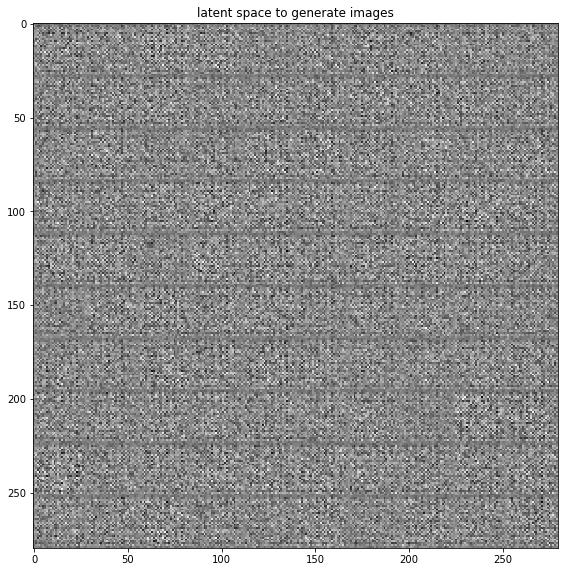

### Epoch 1, Step 0 ###
Current D_loss: 0.37044966220855713, Current G_loss: 1.7135905027389526, current_mutual: -2.6321473121643066, current c loss: -3.0025970935821533, curr d loss: 0.37044966220855713



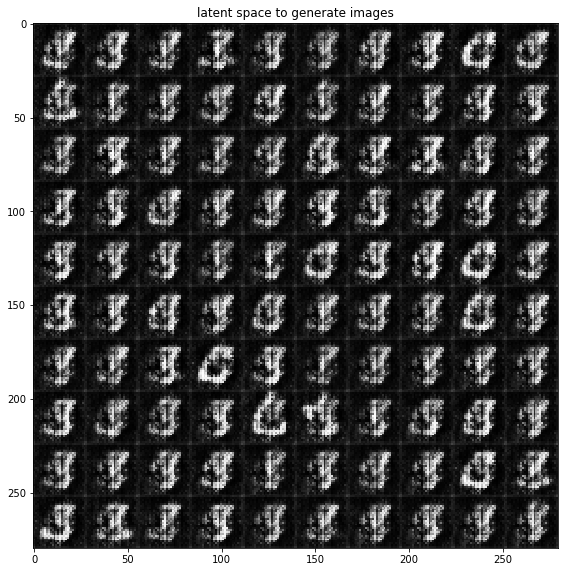

### Epoch 2, Step 0 ###
Current D_loss: 0.26841220259666443, Current G_loss: 1.4331532716751099, current_mutual: -3.1657357215881348, current c loss: -3.434147834777832, curr d loss: 0.26841220259666443



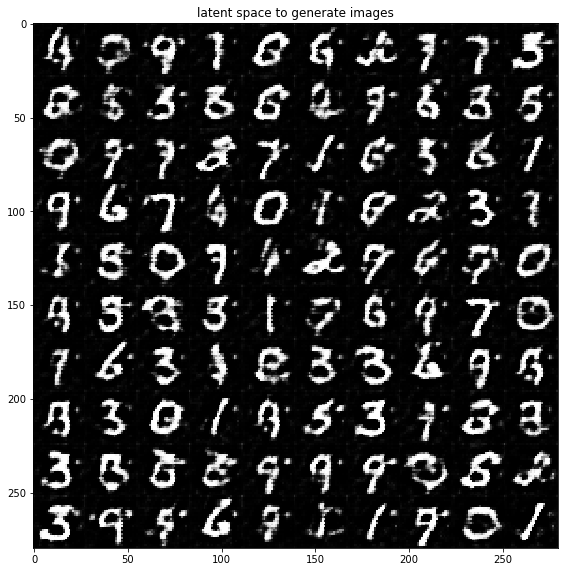

### Epoch 3, Step 0 ###
Current D_loss: 0.15555915236473083, Current G_loss: 1.5637707710266113, current_mutual: -3.519157648086548, current c loss: -3.6747167110443115, curr d loss: 0.15555915236473083



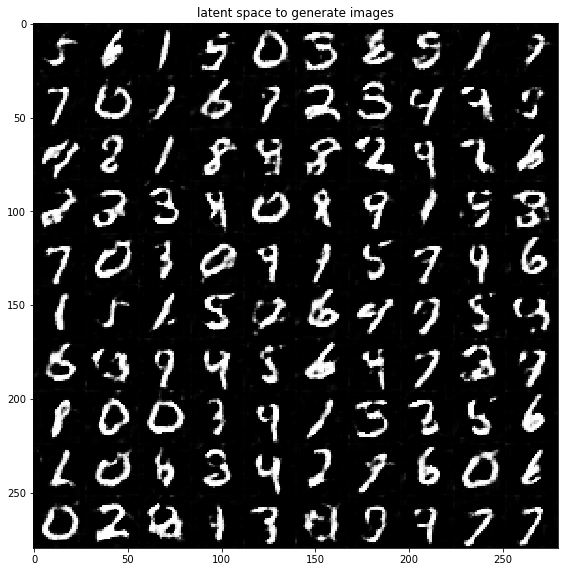

### Epoch 4, Step 0 ###
Current D_loss: 0.14283588528633118, Current G_loss: 1.415252685546875, current_mutual: -2.5153791904449463, current c loss: -2.658215045928955, curr d loss: 0.14283588528633118



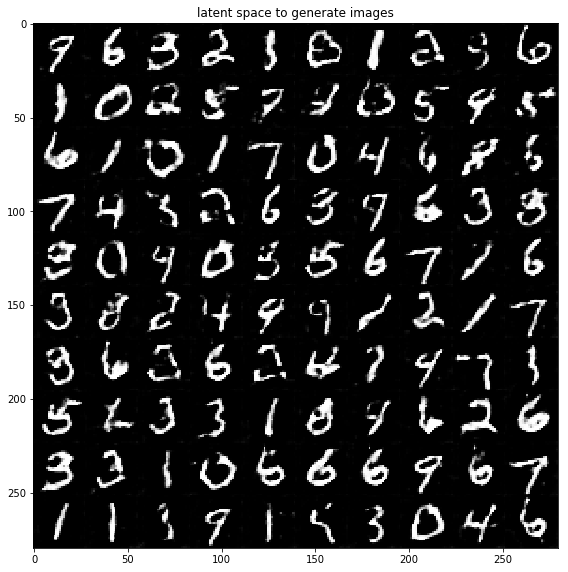

### Epoch 5, Step 0 ###
Current D_loss: 0.0863334909081459, Current G_loss: 1.409561038017273, current_mutual: -3.7650129795074463, current c loss: -3.851346492767334, curr d loss: 0.0863334909081459



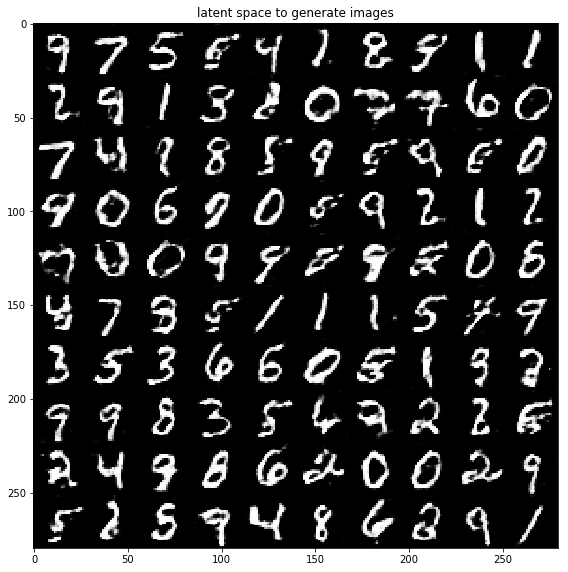

### Epoch 6, Step 0 ###
Current D_loss: 0.057020727545022964, Current G_loss: 1.206381916999817, current_mutual: -2.916203260421753, current c loss: -2.973223924636841, curr d loss: 0.057020727545022964



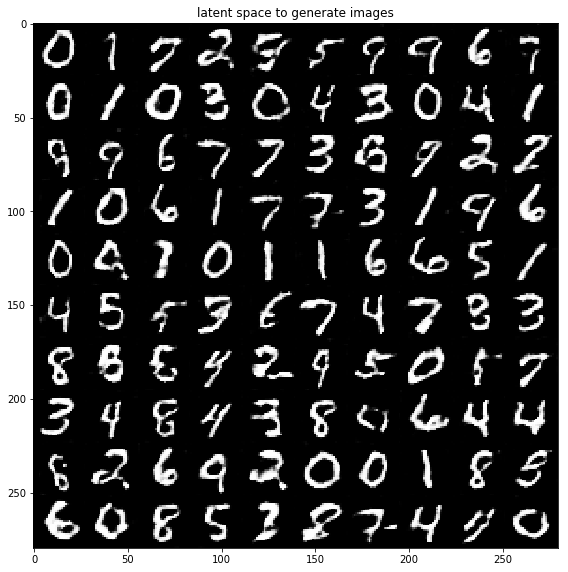

### Epoch 7, Step 0 ###
Current D_loss: 0.04057116061449051, Current G_loss: 1.425132393836975, current_mutual: -3.266247034072876, current c loss: -3.3068182468414307, curr d loss: 0.04057116061449051



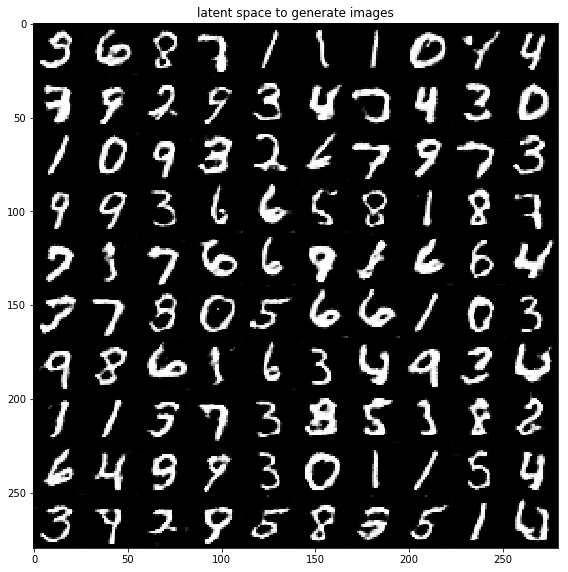

### Epoch 8, Step 0 ###
Current D_loss: 0.05592973530292511, Current G_loss: 1.2647258043289185, current_mutual: -3.7669527530670166, current c loss: -3.8228824138641357, curr d loss: 0.05592973530292511



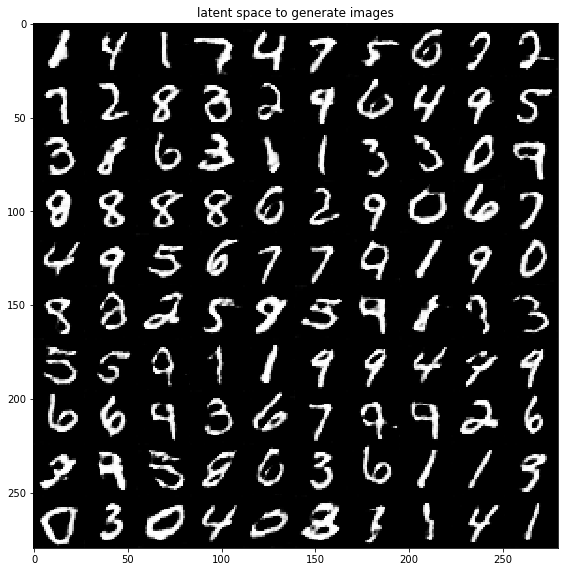

### Epoch 9, Step 0 ###
Current D_loss: 0.03980102390050888, Current G_loss: 1.2727872133255005, current_mutual: -4.026824951171875, current c loss: -4.066626071929932, curr d loss: 0.03980102390050888



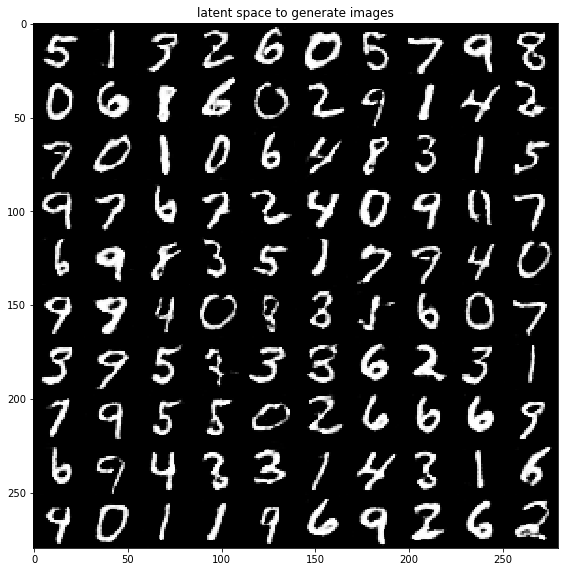

### Epoch 10, Step 0 ###
Current D_loss: 0.026710042729973793, Current G_loss: 1.1861652135849, current_mutual: -3.556161403656006, current c loss: -3.582871437072754, curr d loss: 0.026710042729973793



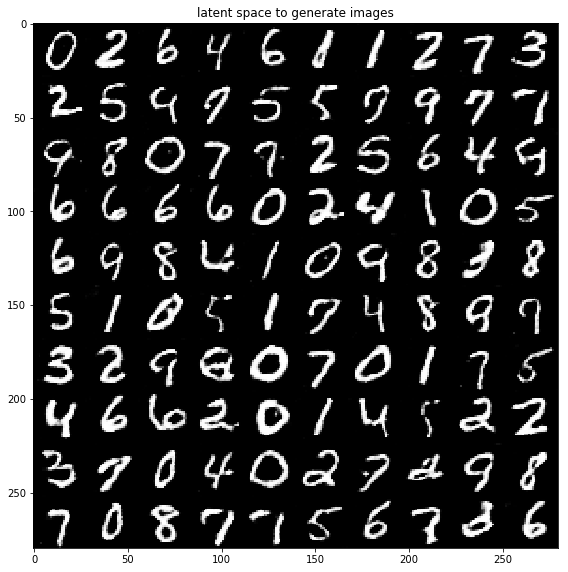

### Epoch 11, Step 0 ###
Current D_loss: 0.025725185871124268, Current G_loss: 1.4448764324188232, current_mutual: -2.6057162284851074, current c loss: -2.631441354751587, curr d loss: 0.025725185871124268



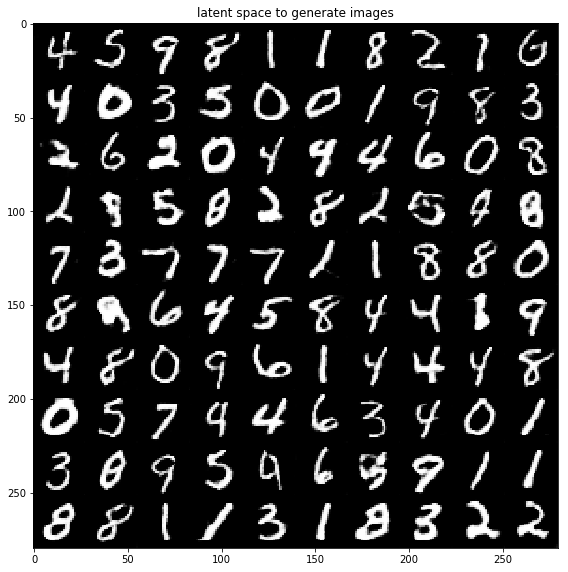

### Epoch 12, Step 0 ###
Current D_loss: 0.02005179412662983, Current G_loss: 1.3600724935531616, current_mutual: -4.075026988983154, current c loss: -4.095078945159912, curr d loss: 0.02005179412662983



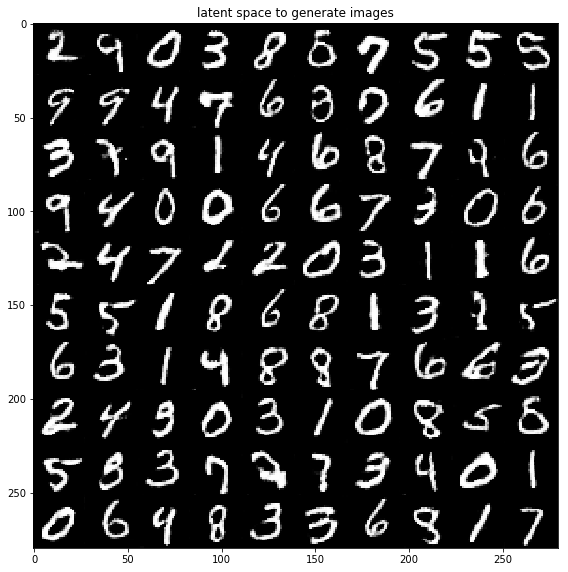

### Epoch 13, Step 0 ###
Current D_loss: 0.03541257232427597, Current G_loss: 1.6875571012496948, current_mutual: -3.967336416244507, current c loss: -4.002748966217041, curr d loss: 0.03541257232427597



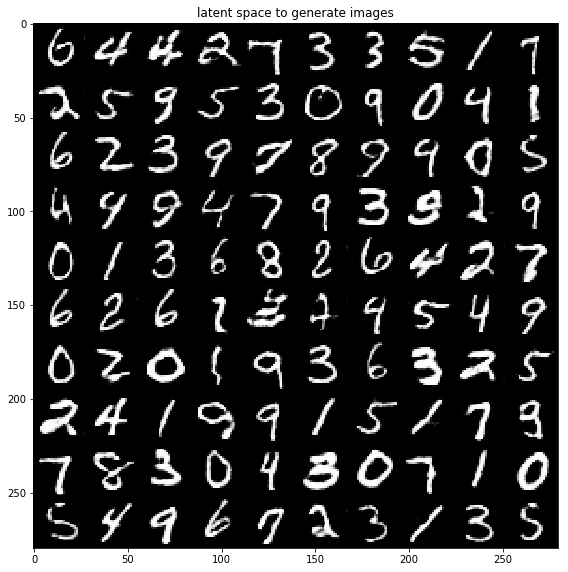

### Epoch 14, Step 0 ###
Current D_loss: 0.024446988478302956, Current G_loss: 1.6078954935073853, current_mutual: -3.517925262451172, current c loss: -3.542372226715088, curr d loss: 0.024446988478302956



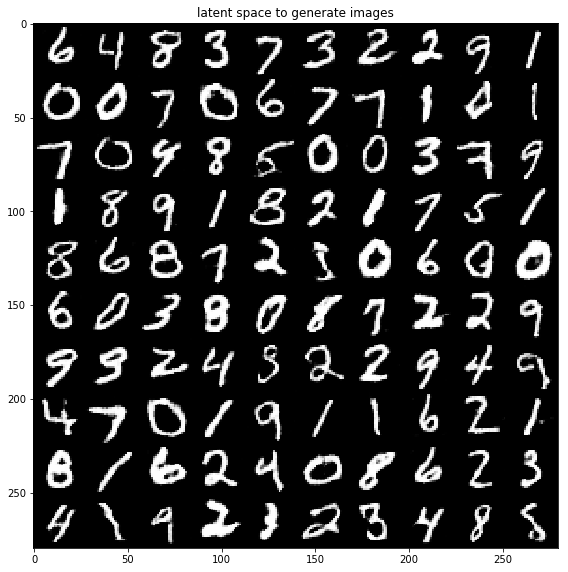

### Epoch 15, Step 0 ###
Current D_loss: 0.022279413416981697, Current G_loss: 1.5606364011764526, current_mutual: -3.804480791091919, current c loss: -3.8267602920532227, curr d loss: 0.022279413416981697



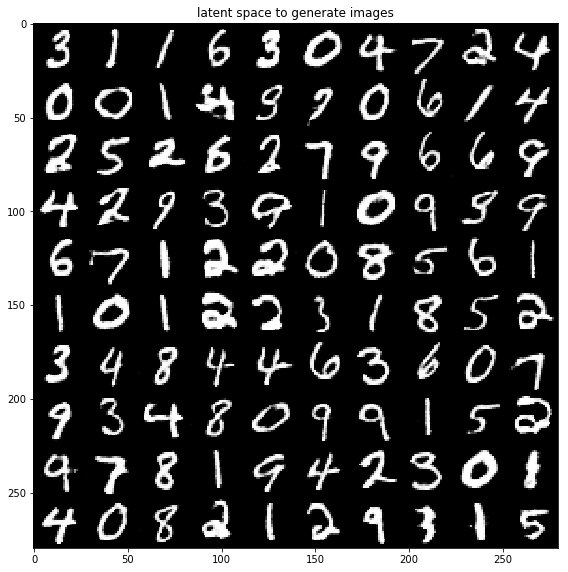

### Epoch 16, Step 0 ###
Current D_loss: 0.01103700790554285, Current G_loss: 1.397429347038269, current_mutual: -3.8032281398773193, current c loss: -3.814265251159668, curr d loss: 0.01103700790554285



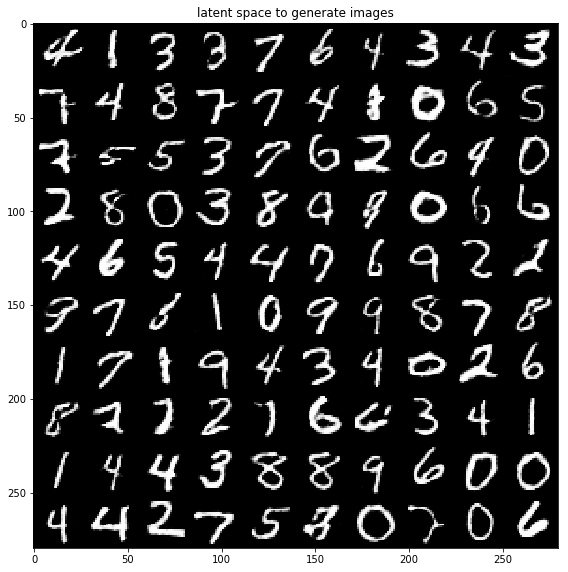

### Epoch 17, Step 0 ###
Current D_loss: 0.014728439040482044, Current G_loss: 1.7884719371795654, current_mutual: -4.520418167114258, current c loss: -4.535146713256836, curr d loss: 0.014728439040482044



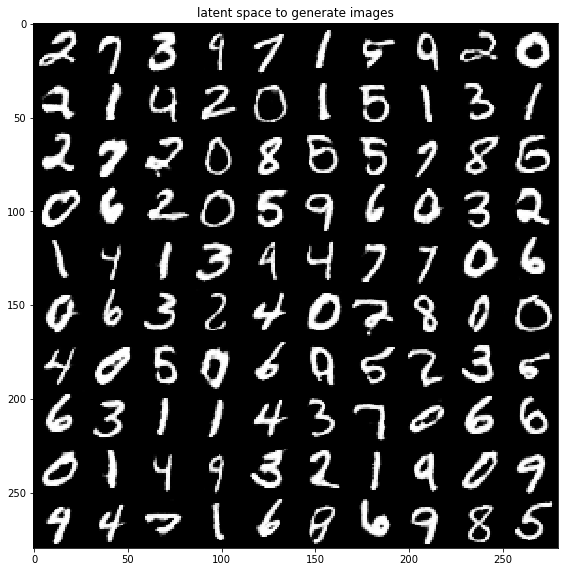

### Epoch 18, Step 0 ###
Current D_loss: 0.01953599601984024, Current G_loss: 1.3430366516113281, current_mutual: -3.4624135494232178, current c loss: -3.4819495677948, curr d loss: 0.01953599601984024



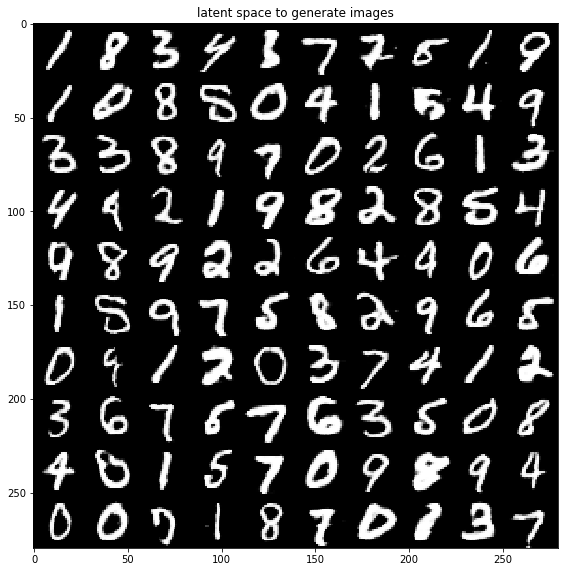

### Epoch 19, Step 0 ###
Current D_loss: 0.015809636563062668, Current G_loss: 1.6893208026885986, current_mutual: -4.206924915313721, current c loss: -4.222734451293945, curr d loss: 0.015809636563062668



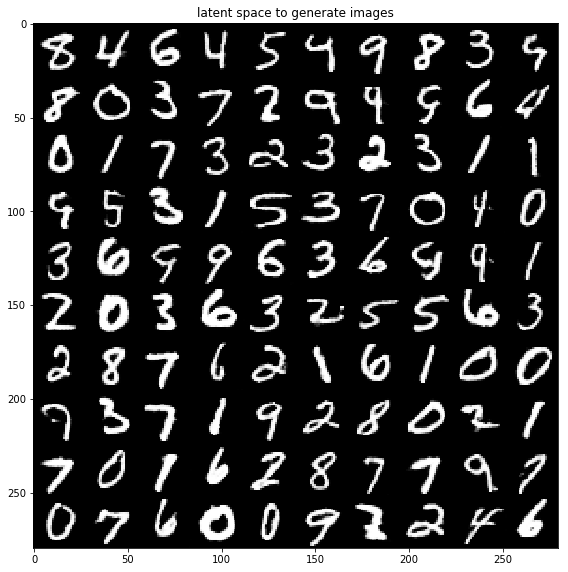

### Epoch 20, Step 0 ###
Current D_loss: 0.01949310302734375, Current G_loss: 1.8280812501907349, current_mutual: -2.0620365142822266, current c loss: -2.0815296173095703, curr d loss: 0.01949310302734375



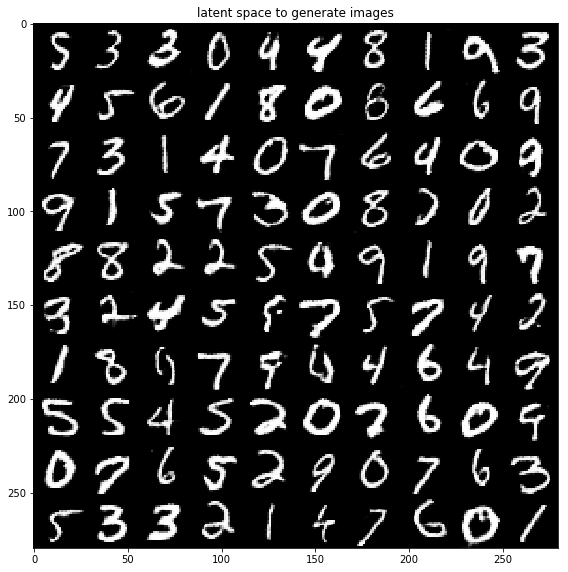

### Epoch 21, Step 0 ###
Current D_loss: 0.08008310198783875, Current G_loss: 1.8206562995910645, current_mutual: -3.562523365020752, current c loss: -3.642606496810913, curr d loss: 0.08008310198783875



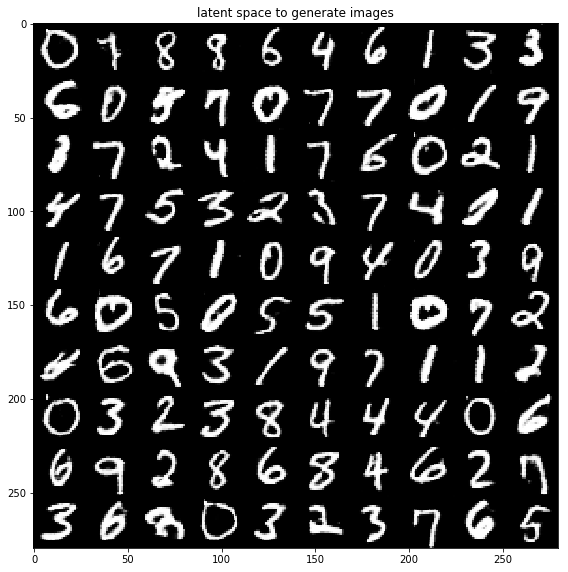

### Epoch 22, Step 0 ###
Current D_loss: 0.006315724924206734, Current G_loss: 1.5986886024475098, current_mutual: -3.3178985118865967, current c loss: -3.324214220046997, curr d loss: 0.006315724924206734



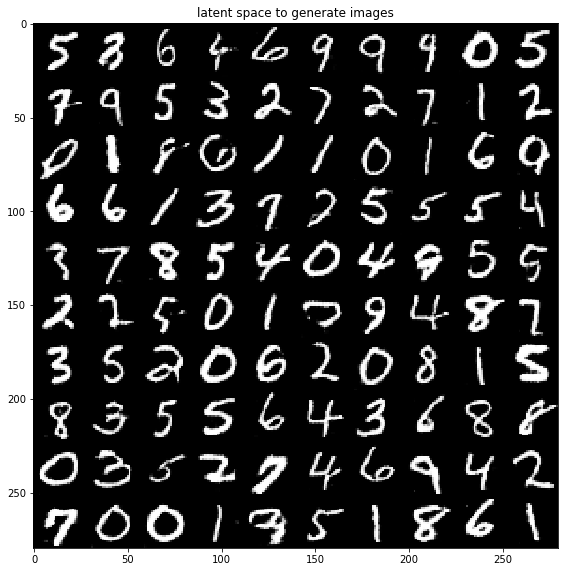

### Epoch 23, Step 0 ###
Current D_loss: 0.012022345326840878, Current G_loss: 1.5803401470184326, current_mutual: -4.34730339050293, current c loss: -4.359325885772705, curr d loss: 0.012022345326840878



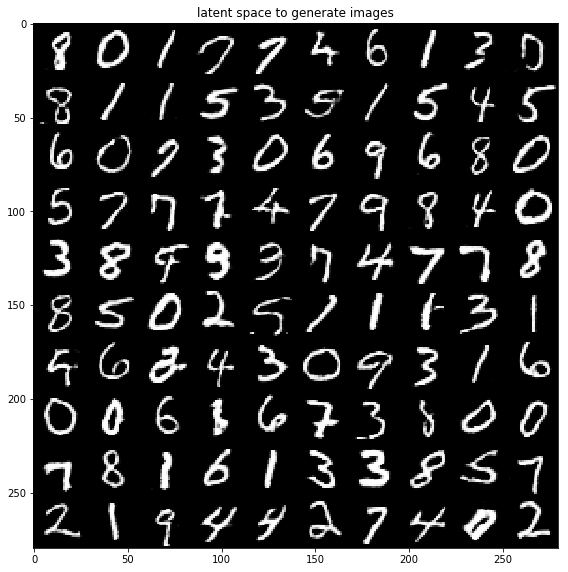

### Epoch 24, Step 0 ###
Current D_loss: 0.01581796631217003, Current G_loss: 2.259697914123535, current_mutual: -4.565012454986572, current c loss: -4.5808305740356445, curr d loss: 0.01581796631217003



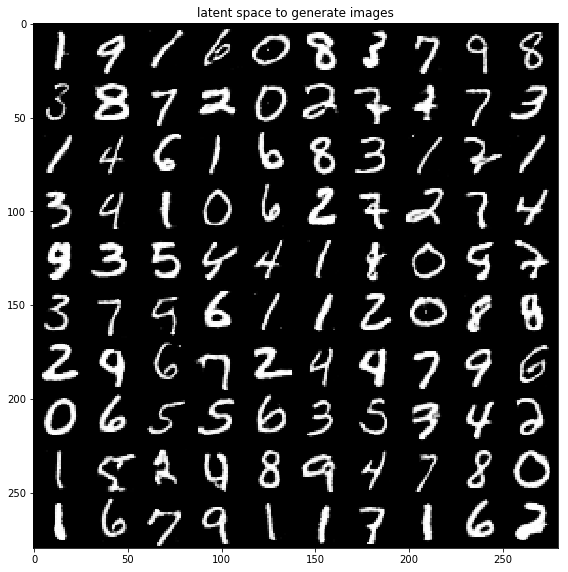

### Epoch 25, Step 0 ###
Current D_loss: 0.03215404599905014, Current G_loss: 1.655787706375122, current_mutual: -4.444287300109863, current c loss: -4.476441383361816, curr d loss: 0.03215404599905014



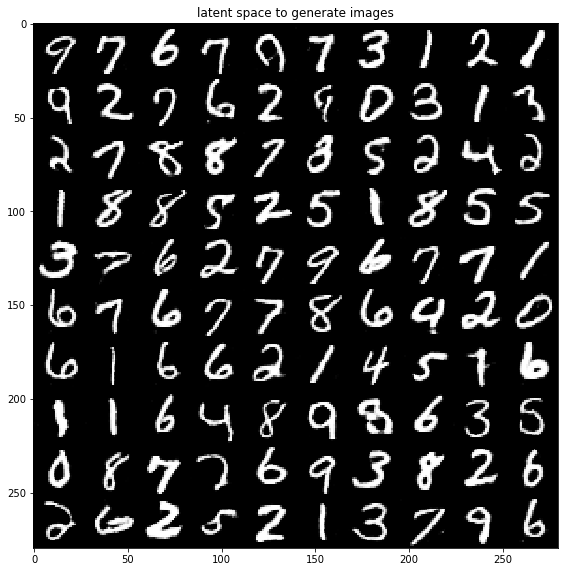

### Epoch 26, Step 0 ###
Current D_loss: 0.00498700188472867, Current G_loss: 1.494166374206543, current_mutual: -3.122971773147583, current c loss: -3.1279587745666504, curr d loss: 0.00498700188472867



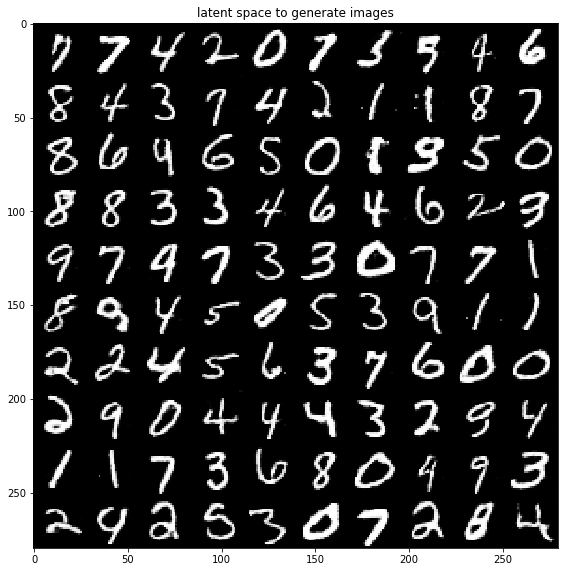

### Epoch 27, Step 0 ###
Current D_loss: 0.004606197588145733, Current G_loss: 2.0339407920837402, current_mutual: -4.463334560394287, current c loss: -4.467940807342529, curr d loss: 0.004606197588145733



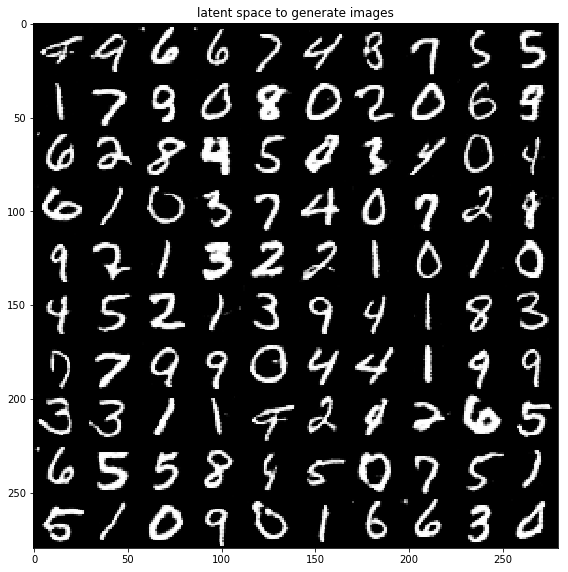

### Epoch 28, Step 0 ###
Current D_loss: 0.010044967755675316, Current G_loss: 1.9429376125335693, current_mutual: -3.813025712966919, current c loss: -3.823070764541626, curr d loss: 0.010044967755675316



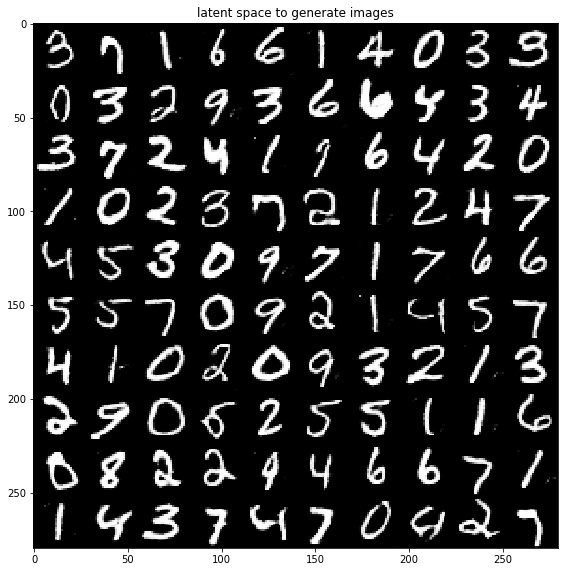

### Epoch 29, Step 0 ###
Current D_loss: 0.03932688385248184, Current G_loss: 2.6899704933166504, current_mutual: -3.4604225158691406, current c loss: -3.4997494220733643, curr d loss: 0.03932688385248184



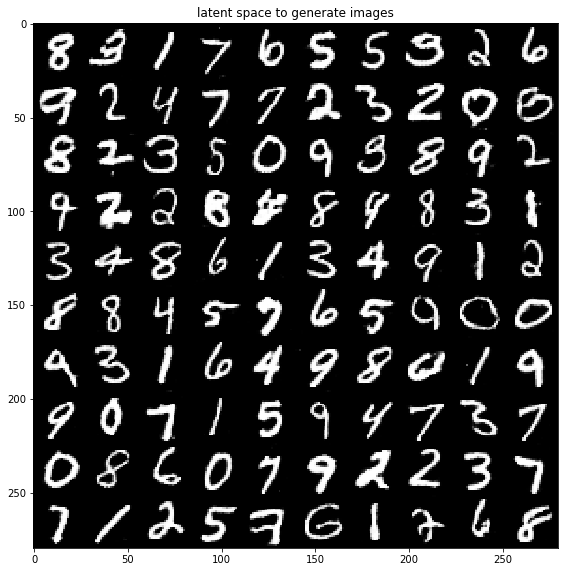

### Epoch 30, Step 0 ###
Current D_loss: 0.006187749095261097, Current G_loss: 2.2723560333251953, current_mutual: -3.4842193126678467, current c loss: -3.4904069900512695, curr d loss: 0.006187749095261097



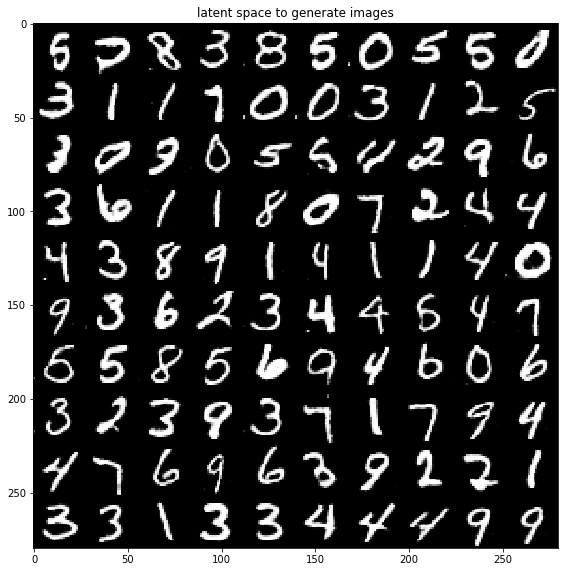

### Epoch 31, Step 0 ###
Current D_loss: 0.010180417448282242, Current G_loss: 2.354111909866333, current_mutual: -4.534688472747803, current c loss: -4.5448689460754395, curr d loss: 0.010180417448282242



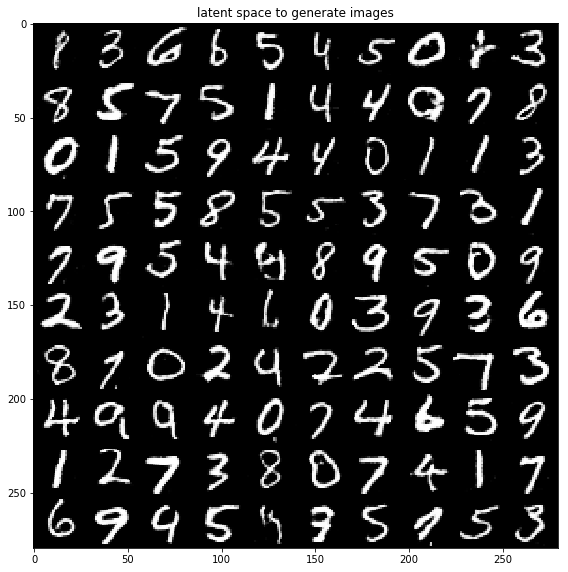

### Epoch 32, Step 0 ###
Current D_loss: 0.06740051507949829, Current G_loss: 2.641752243041992, current_mutual: -4.121646404266357, current c loss: -4.189046859741211, curr d loss: 0.06740051507949829



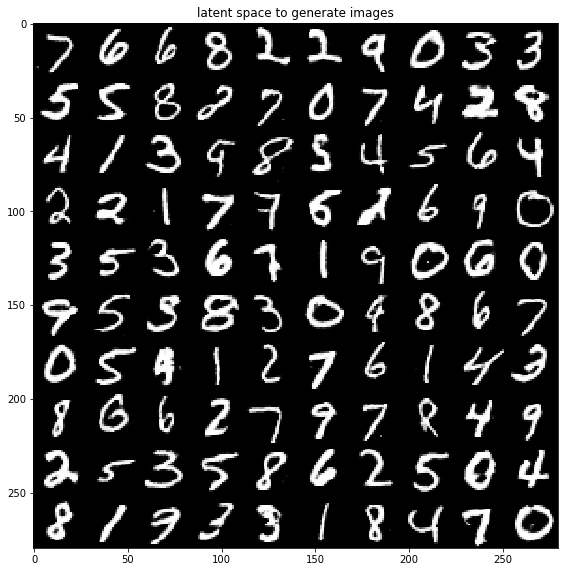

### Epoch 33, Step 0 ###
Current D_loss: 0.02617383748292923, Current G_loss: 3.220082998275757, current_mutual: -4.7347025871276855, current c loss: -4.760876655578613, curr d loss: 0.02617383748292923



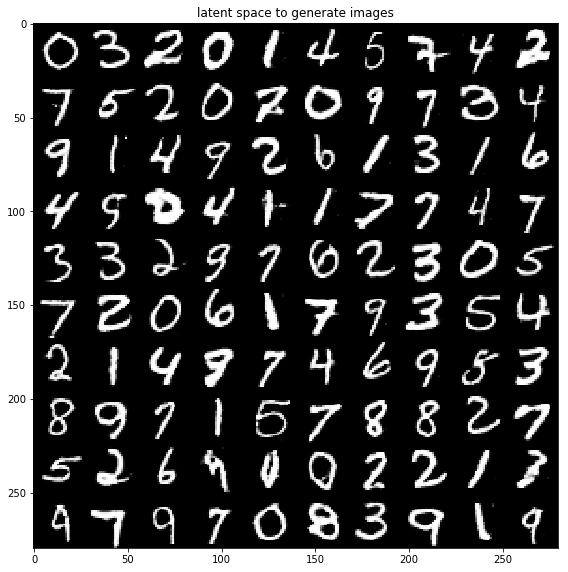

### Epoch 34, Step 0 ###
Current D_loss: 0.01982741802930832, Current G_loss: 2.2226405143737793, current_mutual: -4.508472919464111, current c loss: -4.5283002853393555, curr d loss: 0.01982741802930832



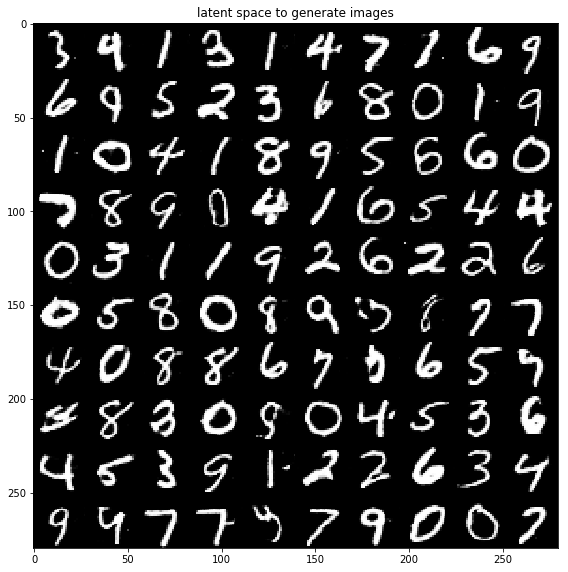

### Epoch 35, Step 0 ###
Current D_loss: 0.012196669355034828, Current G_loss: 2.663194179534912, current_mutual: -4.497757911682129, current c loss: -4.509954452514648, curr d loss: 0.012196669355034828



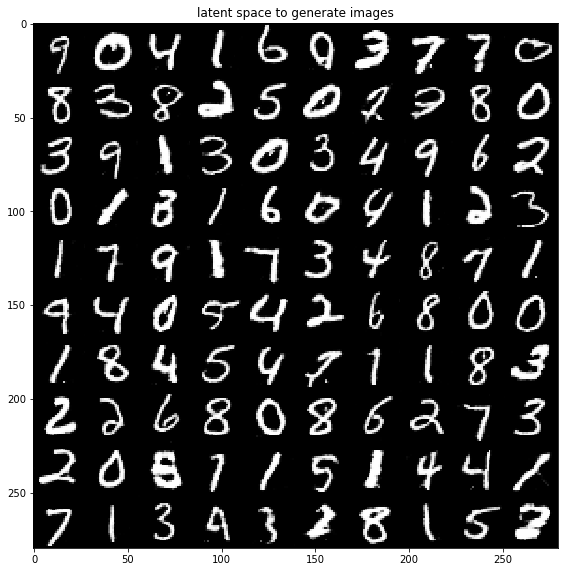

### Epoch 36, Step 0 ###
Current D_loss: 0.00842265598475933, Current G_loss: 2.640979528427124, current_mutual: -3.327094554901123, current c loss: -3.335517168045044, curr d loss: 0.00842265598475933



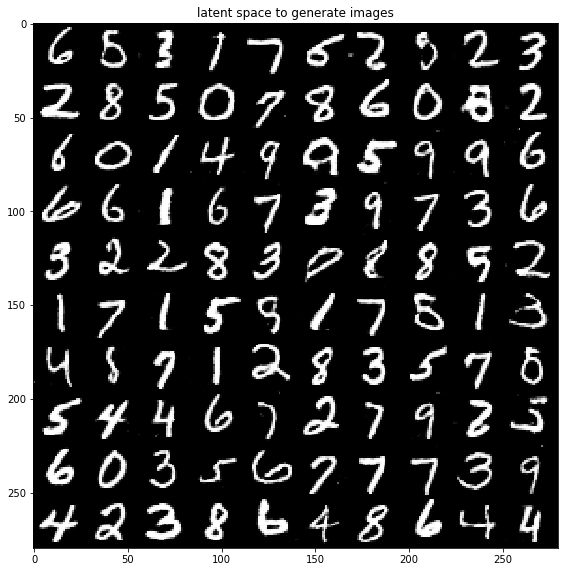

### Epoch 37, Step 0 ###
Current D_loss: 0.0044740657322108746, Current G_loss: 2.501835346221924, current_mutual: -4.479553699493408, current c loss: -4.484027862548828, curr d loss: 0.0044740657322108746



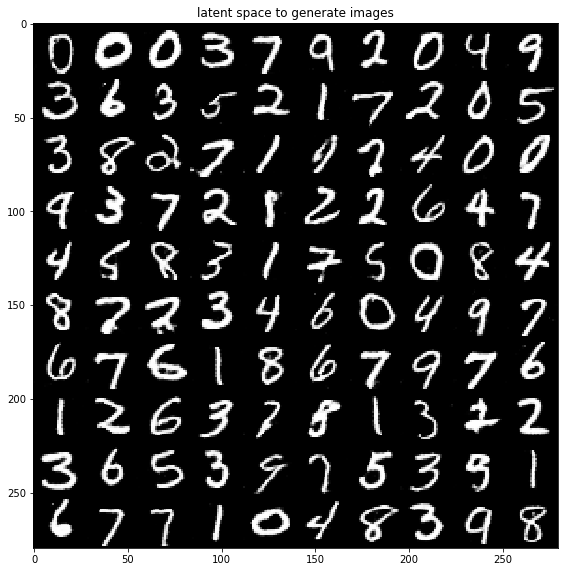

### Epoch 38, Step 0 ###
Current D_loss: 0.005481633357703686, Current G_loss: 2.570992946624756, current_mutual: -4.4353556632995605, current c loss: -4.440837383270264, curr d loss: 0.005481633357703686



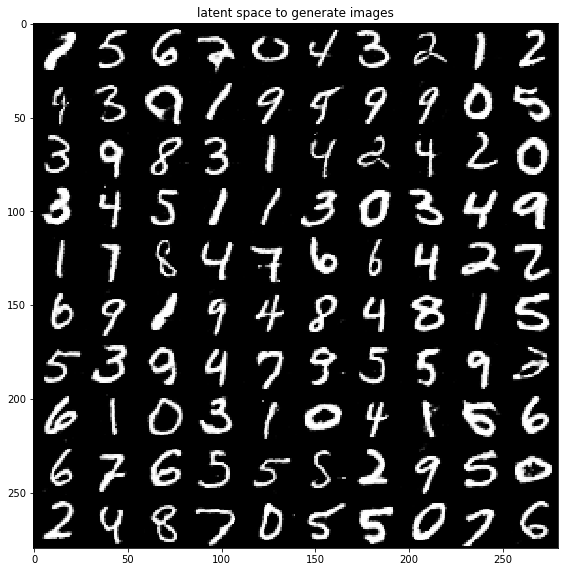

### Epoch 39, Step 0 ###
Current D_loss: 0.018535606563091278, Current G_loss: 2.468878746032715, current_mutual: -2.685044765472412, current c loss: -2.703580379486084, curr d loss: 0.018535606563091278



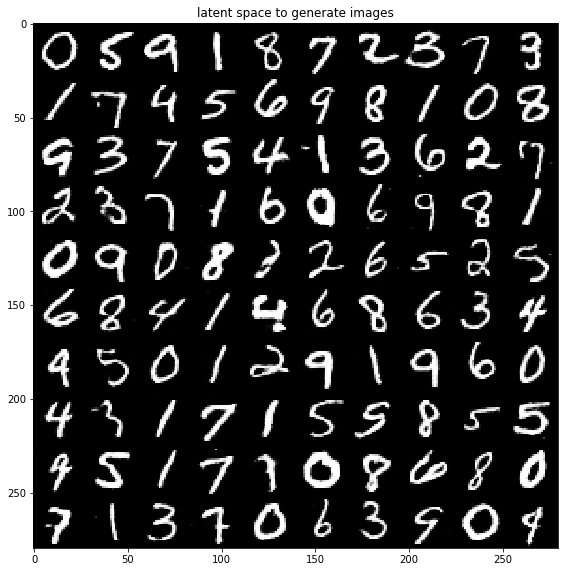

### Epoch 40, Step 0 ###
Current D_loss: 0.0020700236782431602, Current G_loss: 1.8384125232696533, current_mutual: -4.7774763107299805, current c loss: -4.77954626083374, curr d loss: 0.0020700236782431602



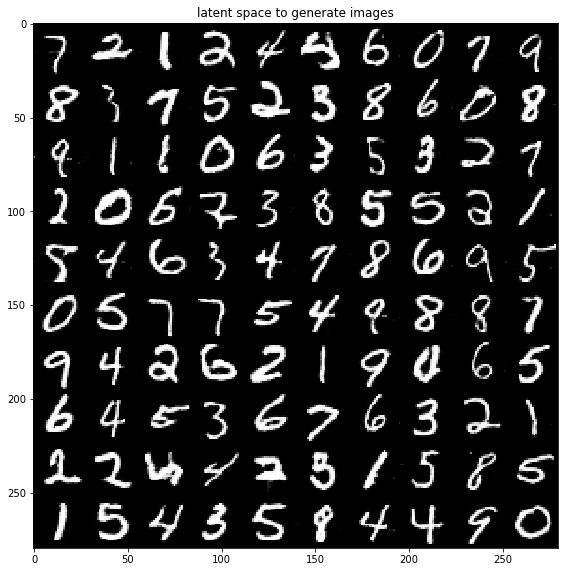

### Epoch 41, Step 0 ###
Current D_loss: 0.0441431999206543, Current G_loss: 2.070524215698242, current_mutual: -4.579448223114014, current c loss: -4.623591423034668, curr d loss: 0.0441431999206543



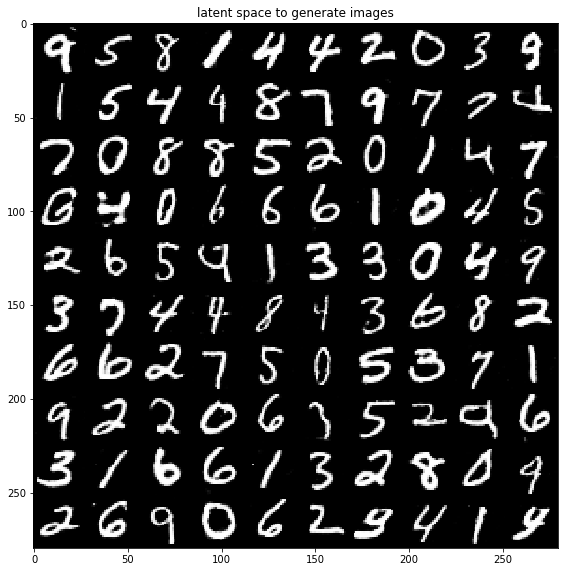

### Epoch 42, Step 0 ###
Current D_loss: 0.00618230365216732, Current G_loss: 2.228963851928711, current_mutual: -4.193408966064453, current c loss: -4.199591159820557, curr d loss: 0.00618230365216732



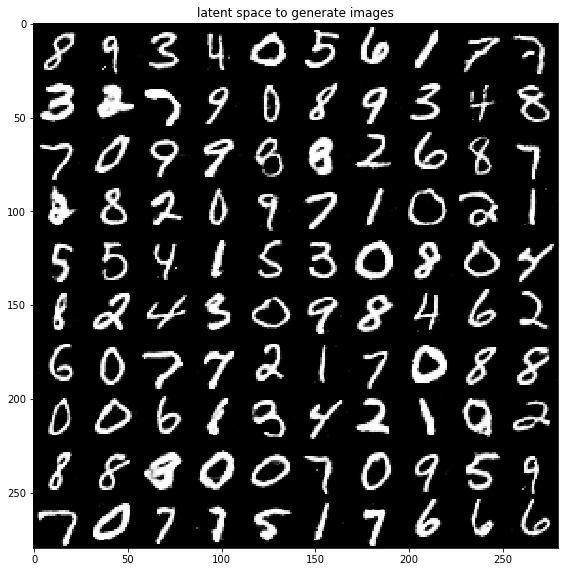

### Epoch 43, Step 0 ###
Current D_loss: 0.00790962390601635, Current G_loss: 1.8979618549346924, current_mutual: -4.53171443939209, current c loss: -4.539624214172363, curr d loss: 0.00790962390601635



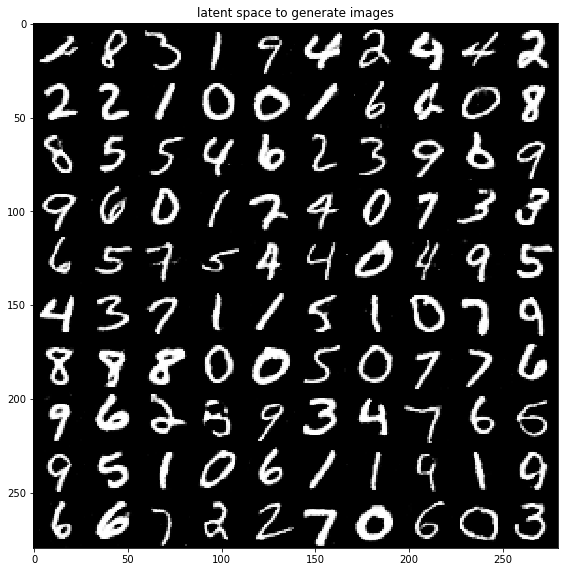

### Epoch 44, Step 0 ###
Current D_loss: 0.02911449410021305, Current G_loss: 2.6857714653015137, current_mutual: -4.717792510986328, current c loss: -4.7469072341918945, curr d loss: 0.02911449410021305



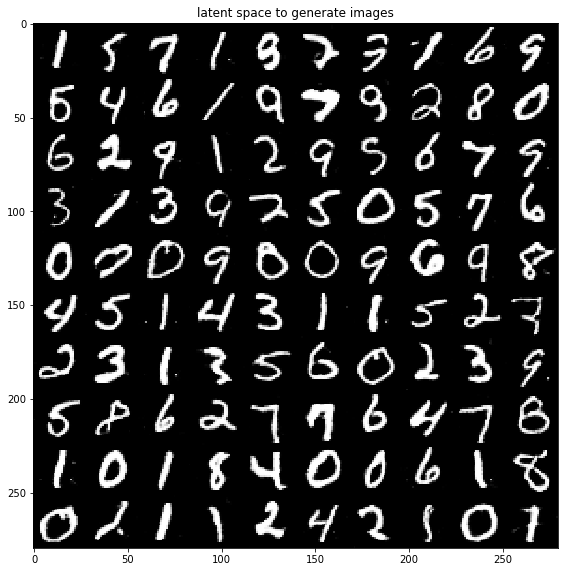

### Epoch 45, Step 0 ###
Current D_loss: 0.007372741121798754, Current G_loss: 2.2109196186065674, current_mutual: -4.6751532554626465, current c loss: -4.682526111602783, curr d loss: 0.007372741121798754



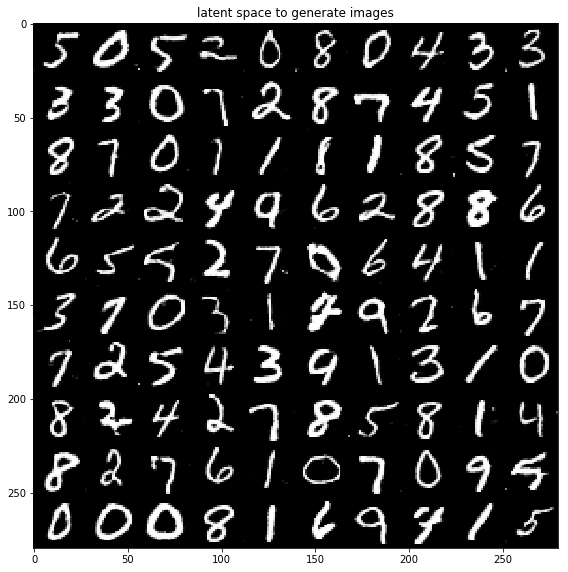

### Epoch 46, Step 0 ###
Current D_loss: 0.015346158295869827, Current G_loss: 2.867196559906006, current_mutual: -3.7418551445007324, current c loss: -3.7572011947631836, curr d loss: 0.015346158295869827



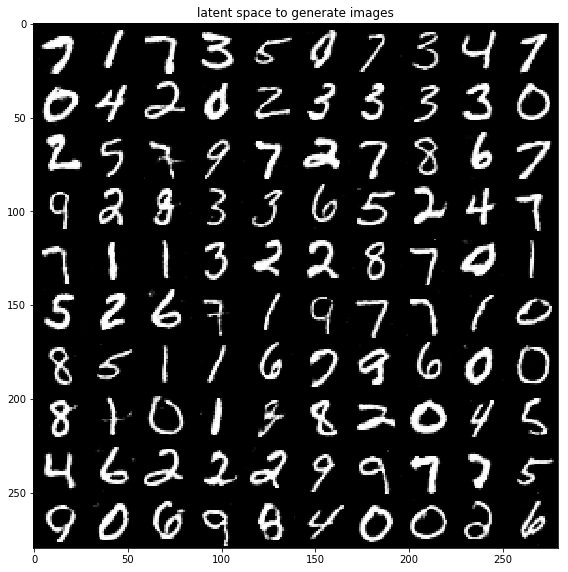

### Epoch 47, Step 0 ###
Current D_loss: 0.003773279720917344, Current G_loss: 2.583768606185913, current_mutual: -4.646792888641357, current c loss: -4.650566101074219, curr d loss: 0.003773279720917344



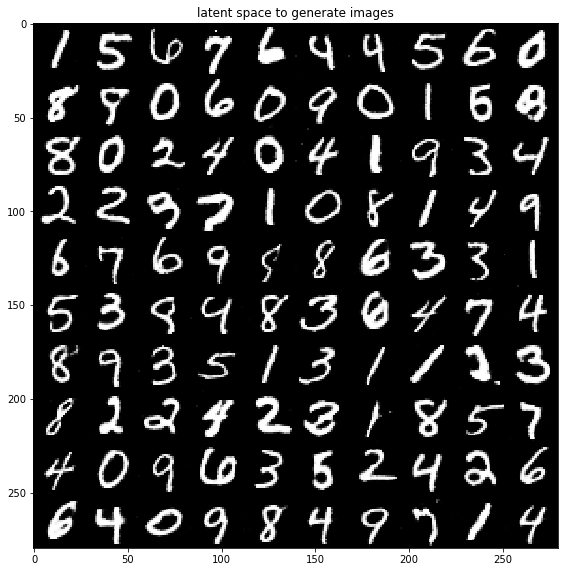

### Epoch 48, Step 0 ###
Current D_loss: 0.029097454622387886, Current G_loss: 1.8402329683303833, current_mutual: -4.810291290283203, current c loss: -4.839388847351074, curr d loss: 0.029097454622387886



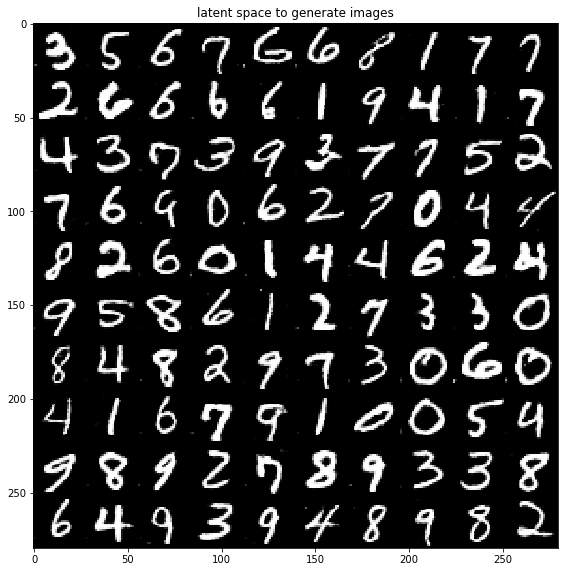

### Epoch 49, Step 0 ###
Current D_loss: 0.009185122326016426, Current G_loss: 2.5897796154022217, current_mutual: -4.082616329193115, current c loss: -4.091801643371582, curr d loss: 0.009185122326016426



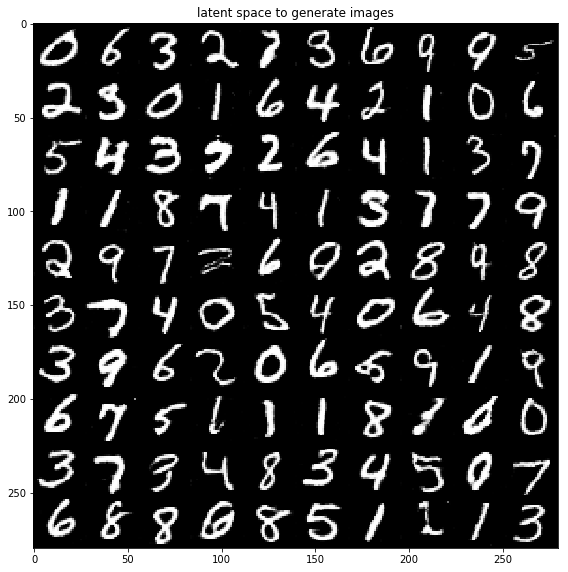

### Epoch 50, Step 0 ###
Current D_loss: 0.005697461776435375, Current G_loss: 2.474163293838501, current_mutual: -4.098091125488281, current c loss: -4.103788375854492, curr d loss: 0.005697461776435375



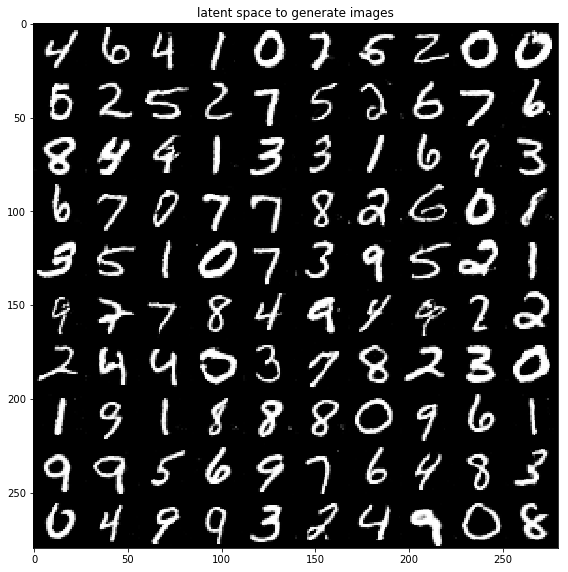

### Epoch 51, Step 0 ###
Current D_loss: 0.0038604510482400656, Current G_loss: 3.7797884941101074, current_mutual: -4.711442470550537, current c loss: -4.71530294418335, curr d loss: 0.0038604510482400656



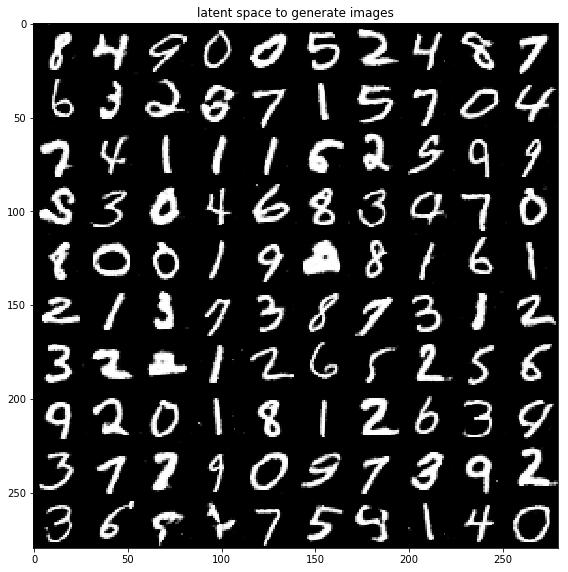

### Epoch 52, Step 0 ###
Current D_loss: 0.01935148425400257, Current G_loss: 2.762852191925049, current_mutual: -4.214441776275635, current c loss: -4.233793258666992, curr d loss: 0.01935148425400257



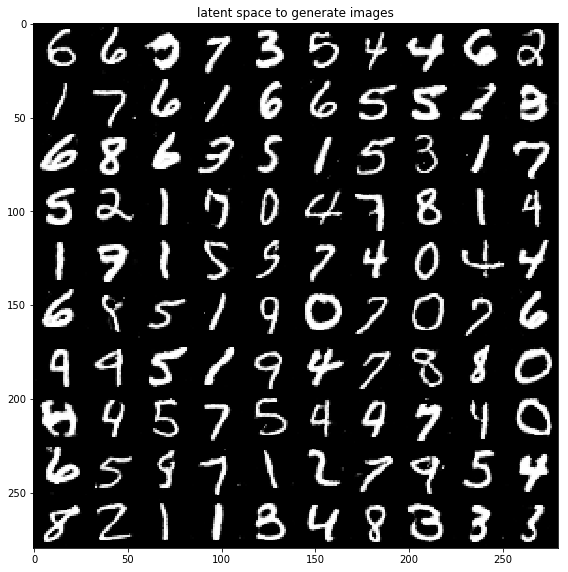

### Epoch 53, Step 0 ###
Current D_loss: 0.0035200202837586403, Current G_loss: 2.772698402404785, current_mutual: -4.100615978240967, current c loss: -4.104135990142822, curr d loss: 0.0035200202837586403



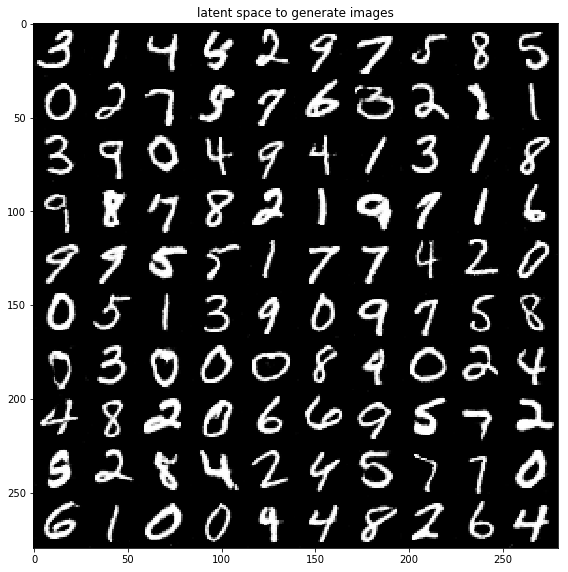

### Epoch 54, Step 0 ###
Current D_loss: 0.007398192770779133, Current G_loss: 2.3867385387420654, current_mutual: -4.584116458892822, current c loss: -4.591514587402344, curr d loss: 0.007398192770779133



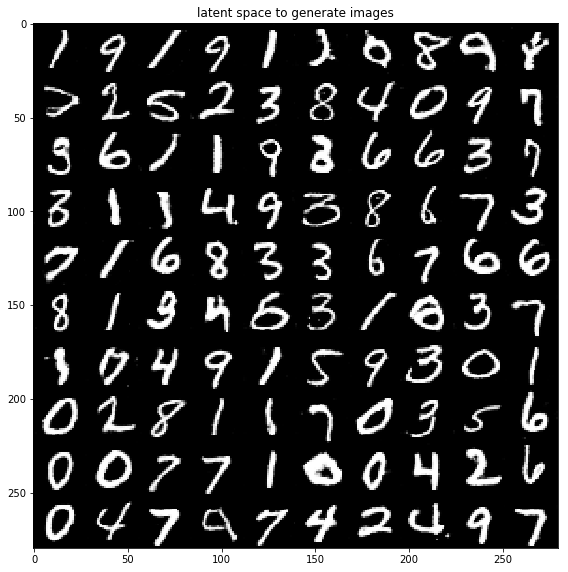

### Epoch 55, Step 0 ###
Current D_loss: 0.008812411688268185, Current G_loss: 2.494065046310425, current_mutual: -4.8251471519470215, current c loss: -4.833959579467773, curr d loss: 0.008812411688268185



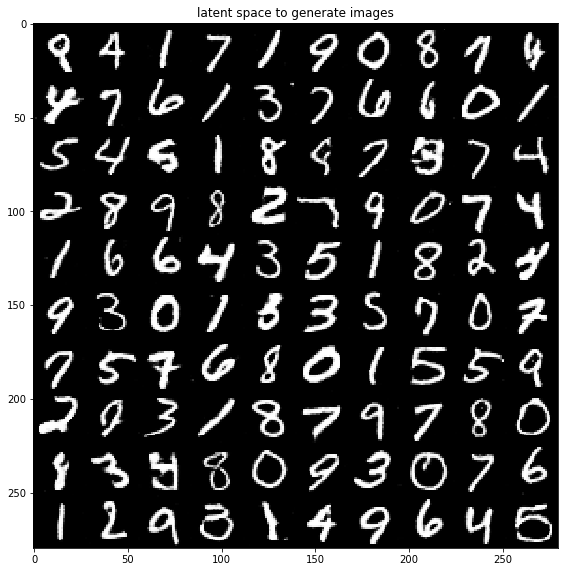

### Epoch 56, Step 0 ###
Current D_loss: 0.00718292873352766, Current G_loss: 3.116178035736084, current_mutual: -3.53324294090271, current c loss: -3.5404257774353027, curr d loss: 0.00718292873352766



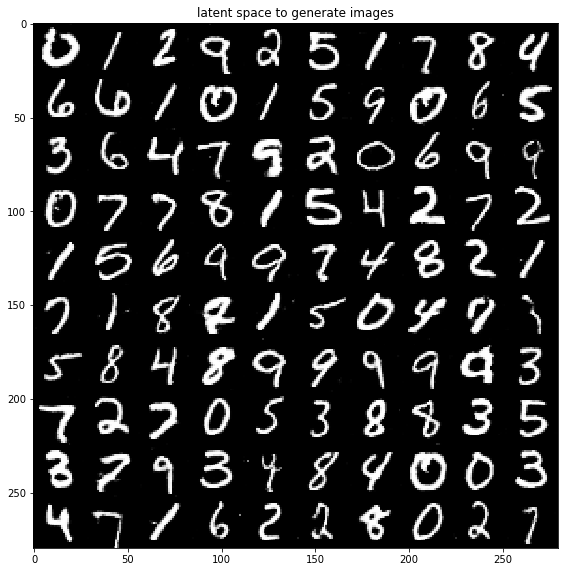

### Epoch 57, Step 0 ###
Current D_loss: 0.034220900386571884, Current G_loss: 3.065997362136841, current_mutual: -4.451807975769043, current c loss: -4.486028671264648, curr d loss: 0.034220900386571884



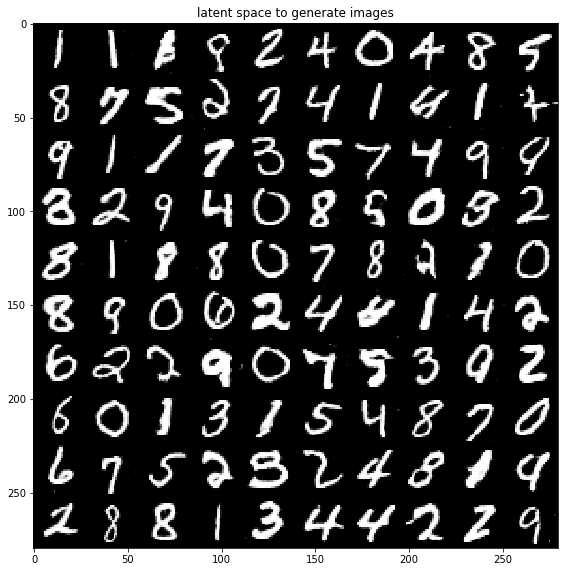

### Epoch 58, Step 0 ###
Current D_loss: 0.0024565455969423056, Current G_loss: 3.1754260063171387, current_mutual: -4.524432182312012, current c loss: -4.526888847351074, curr d loss: 0.0024565455969423056



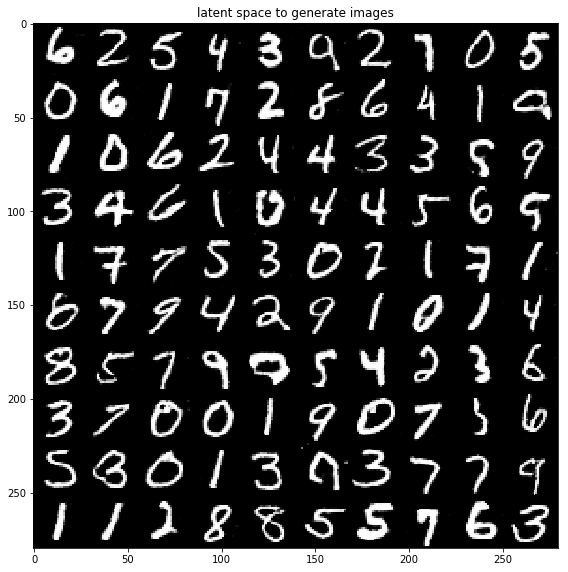

### Epoch 59, Step 0 ###
Current D_loss: 0.017918994650244713, Current G_loss: 2.758577823638916, current_mutual: -4.681620121002197, current c loss: -4.6995391845703125, curr d loss: 0.017918994650244713



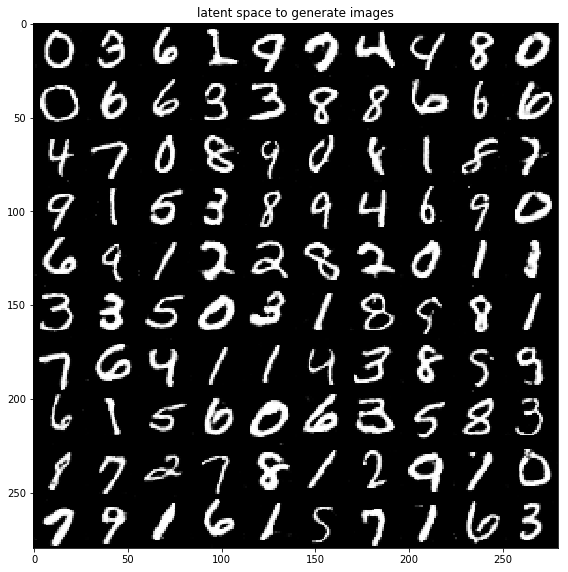

### Epoch 60, Step 0 ###
Current D_loss: 0.02500169910490513, Current G_loss: 3.015578508377075, current_mutual: -4.616438865661621, current c loss: -4.641440391540527, curr d loss: 0.02500169910490513



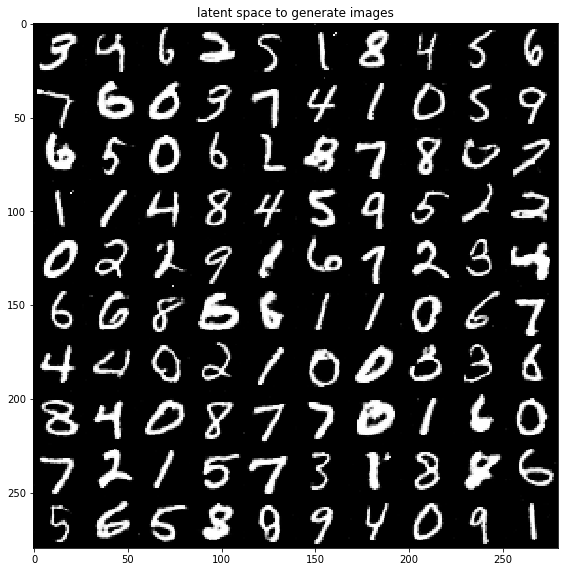

### Epoch 61, Step 0 ###
Current D_loss: 0.030016351491212845, Current G_loss: 2.977865219116211, current_mutual: -4.027588367462158, current c loss: -4.057604789733887, curr d loss: 0.030016351491212845



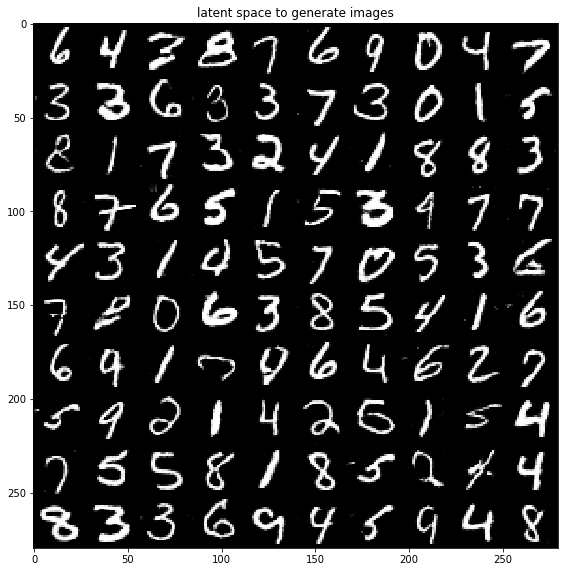

### Epoch 62, Step 0 ###
Current D_loss: 0.005134915933012962, Current G_loss: 2.2850632667541504, current_mutual: -4.660184860229492, current c loss: -4.665319919586182, curr d loss: 0.005134915933012962



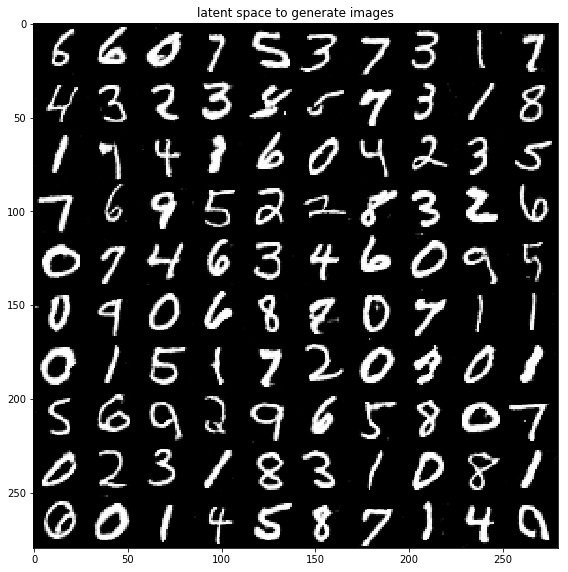

### Epoch 63, Step 0 ###
Current D_loss: 0.004192194901406765, Current G_loss: 1.9801329374313354, current_mutual: -4.814248561859131, current c loss: -4.818440914154053, curr d loss: 0.004192194901406765



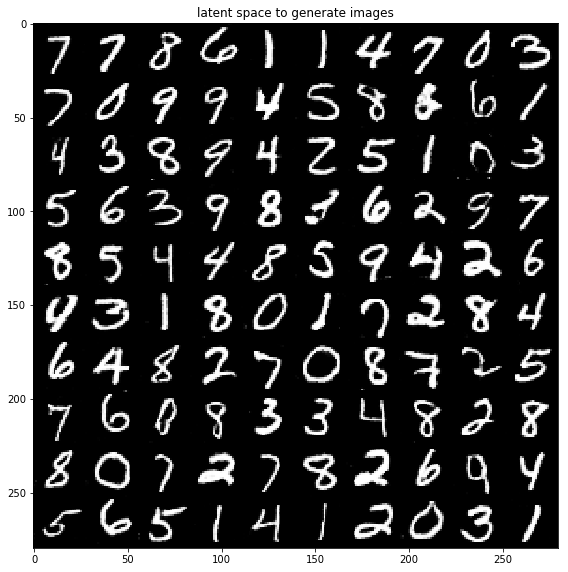

### Epoch 64, Step 0 ###
Current D_loss: 0.026841837912797928, Current G_loss: 2.781292200088501, current_mutual: -4.5396728515625, current c loss: -4.566514492034912, curr d loss: 0.026841837912797928



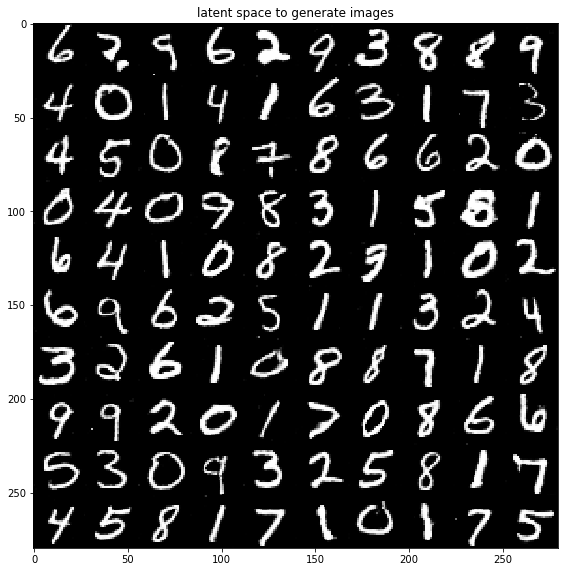

### Epoch 65, Step 0 ###
Current D_loss: 0.01888858713209629, Current G_loss: 3.3678109645843506, current_mutual: -4.581368446350098, current c loss: -4.60025691986084, curr d loss: 0.01888858713209629



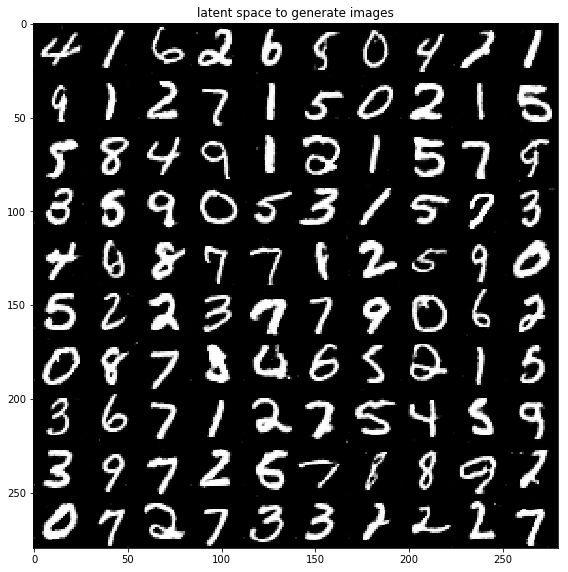

### Epoch 66, Step 0 ###
Current D_loss: 0.0019946557004004717, Current G_loss: 3.1703755855560303, current_mutual: -4.455616474151611, current c loss: -4.457611083984375, curr d loss: 0.0019946557004004717



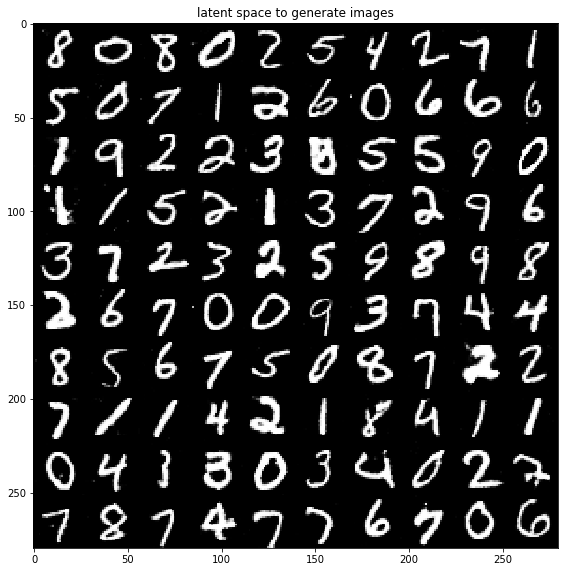

### Epoch 67, Step 0 ###
Current D_loss: 0.013362225145101547, Current G_loss: 2.711042881011963, current_mutual: -4.4014387130737305, current c loss: -4.414801120758057, curr d loss: 0.013362225145101547



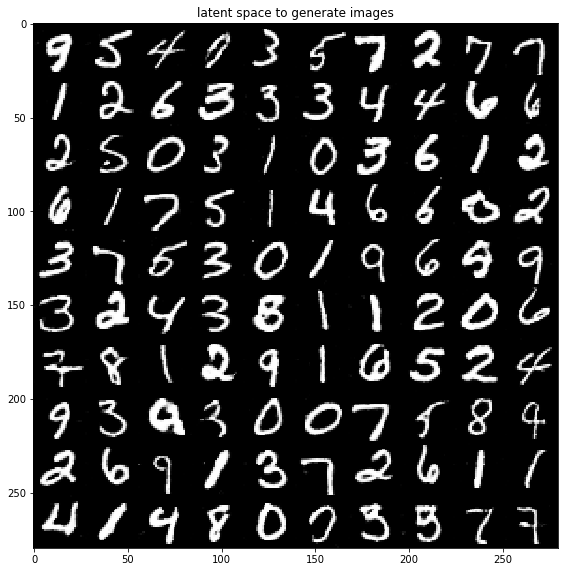

### Epoch 68, Step 0 ###
Current D_loss: 0.0404113233089447, Current G_loss: 2.6399881839752197, current_mutual: -4.062262535095215, current c loss: -4.1026740074157715, curr d loss: 0.0404113233089447



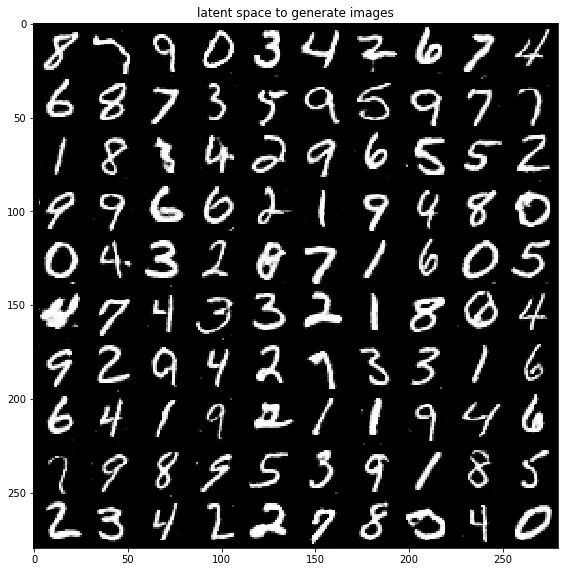

### Epoch 69, Step 0 ###
Current D_loss: 0.0027651444543153048, Current G_loss: 2.6117920875549316, current_mutual: -4.717661380767822, current c loss: -4.720426559448242, curr d loss: 0.0027651444543153048



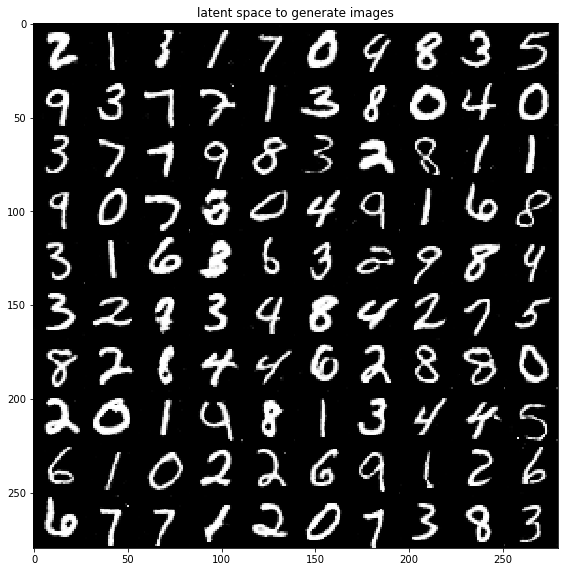

### Epoch 70, Step 0 ###
Current D_loss: 0.0015730150043964386, Current G_loss: 3.8417301177978516, current_mutual: -4.860567092895508, current c loss: -4.86214017868042, curr d loss: 0.0015730150043964386



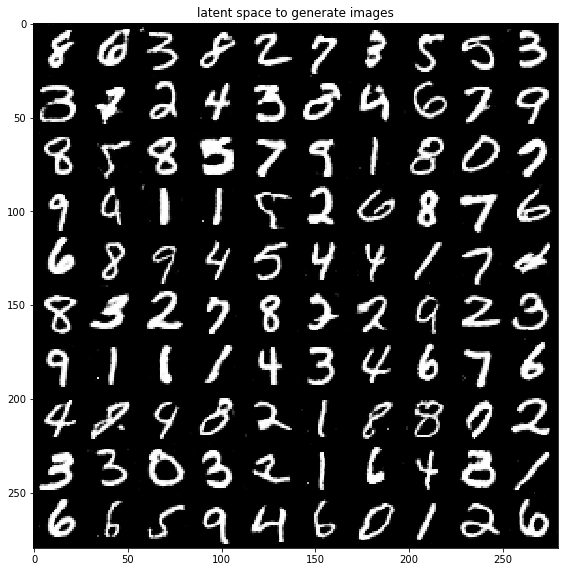

### Epoch 71, Step 0 ###
Current D_loss: 0.01389393676072359, Current G_loss: 2.7077341079711914, current_mutual: -4.70572566986084, current c loss: -4.7196197509765625, curr d loss: 0.01389393676072359



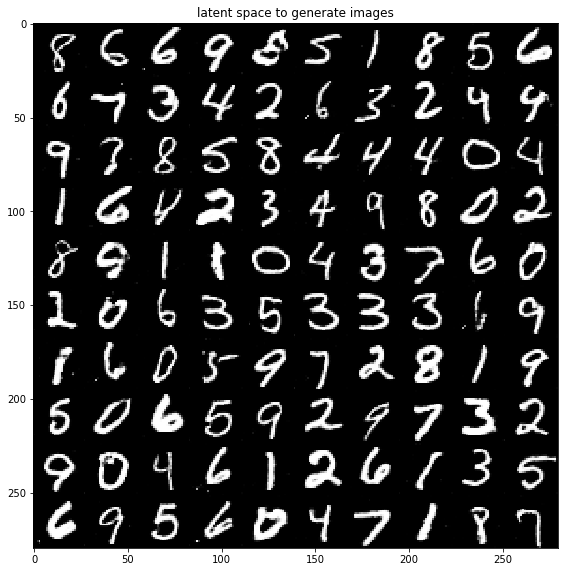

### Epoch 72, Step 0 ###
Current D_loss: 0.0028178500942885876, Current G_loss: 3.239687204360962, current_mutual: -4.600481986999512, current c loss: -4.603299617767334, curr d loss: 0.0028178500942885876



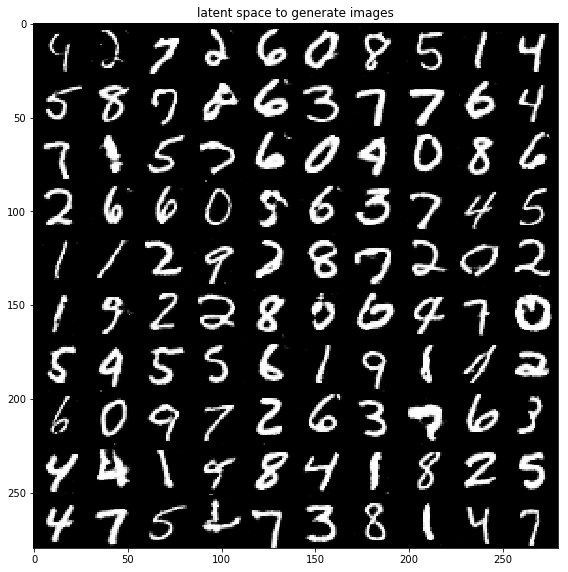

### Epoch 73, Step 0 ###
Current D_loss: 0.0045042382553219795, Current G_loss: 2.391148805618286, current_mutual: -4.7248215675354, current c loss: -4.729325771331787, curr d loss: 0.0045042382553219795



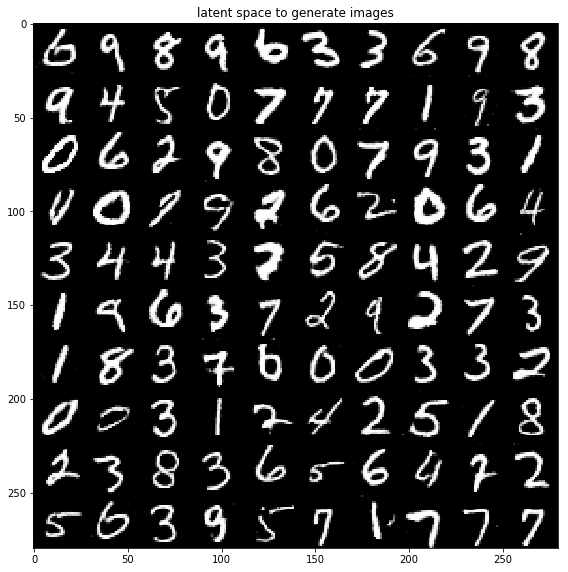

### Epoch 74, Step 0 ###
Current D_loss: 0.005919043440371752, Current G_loss: 3.3411474227905273, current_mutual: -4.521717548370361, current c loss: -4.527636528015137, curr d loss: 0.005919043440371752



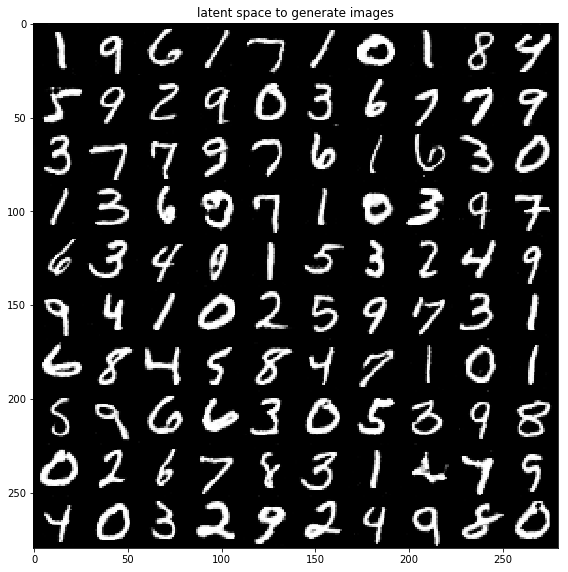

### Epoch 75, Step 0 ###
Current D_loss: 0.005428771488368511, Current G_loss: 2.2420732975006104, current_mutual: -4.761436462402344, current c loss: -4.766865253448486, curr d loss: 0.005428771488368511



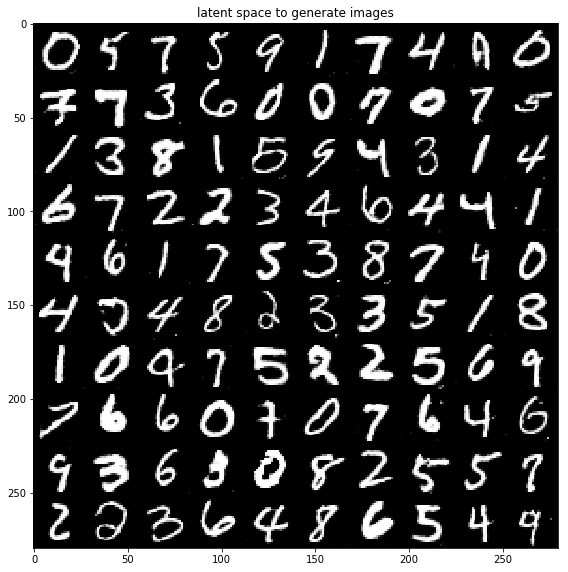

### Epoch 76, Step 0 ###
Current D_loss: 0.01137570384889841, Current G_loss: 3.3746652603149414, current_mutual: -4.868315696716309, current c loss: -4.8796916007995605, curr d loss: 0.01137570384889841



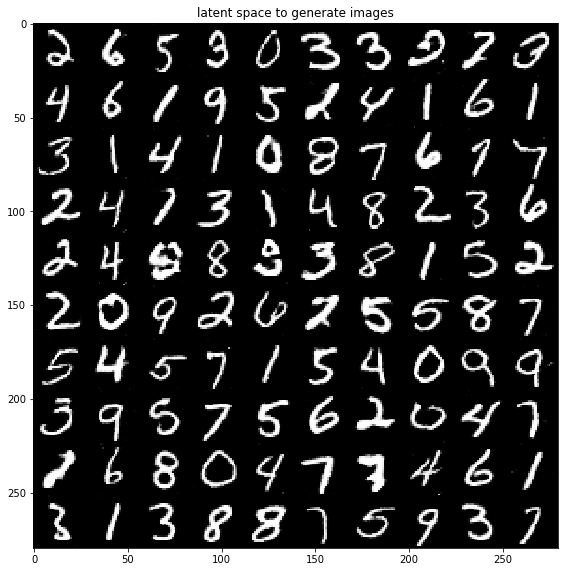

### Epoch 77, Step 0 ###
Current D_loss: 0.003726904047653079, Current G_loss: 3.5118401050567627, current_mutual: -4.6605072021484375, current c loss: -4.664234161376953, curr d loss: 0.003726904047653079



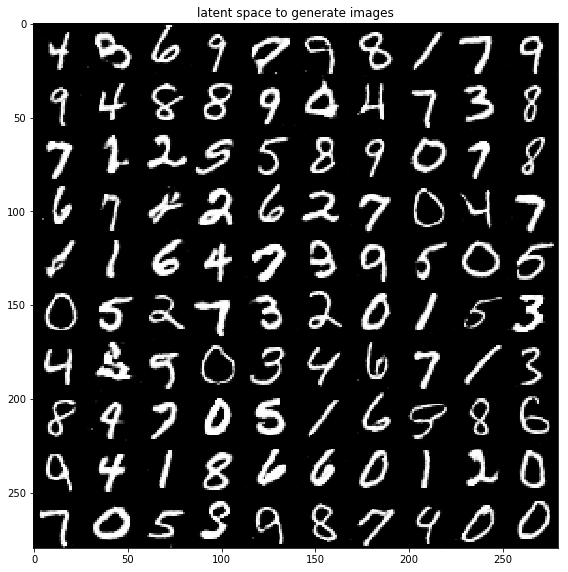

### Epoch 78, Step 0 ###
Current D_loss: 0.009007497690618038, Current G_loss: 3.2573511600494385, current_mutual: -4.435652256011963, current c loss: -4.44465970993042, curr d loss: 0.009007497690618038



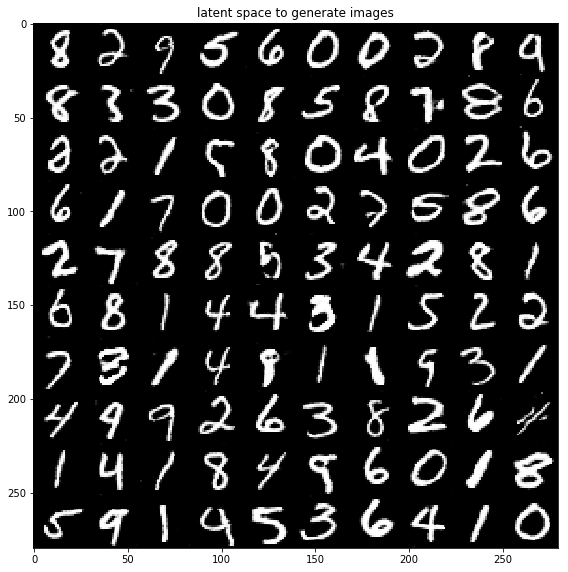

### Epoch 79, Step 0 ###
Current D_loss: 0.003819522447884083, Current G_loss: 2.5559067726135254, current_mutual: -4.859847545623779, current c loss: -4.863667011260986, curr d loss: 0.003819522447884083



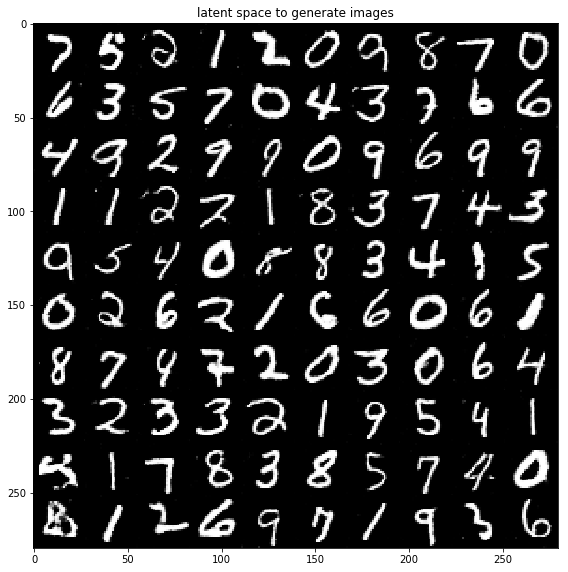

### Epoch 80, Step 0 ###
Current D_loss: 0.002388971857726574, Current G_loss: 2.2012832164764404, current_mutual: -4.526548862457275, current c loss: -4.528937816619873, curr d loss: 0.002388971857726574



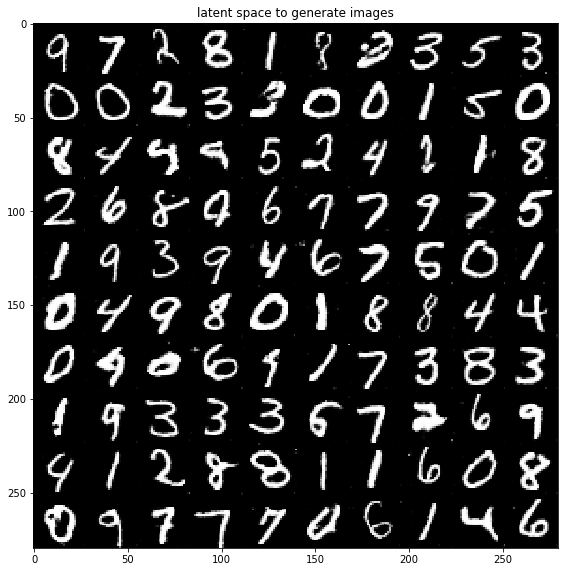

### Epoch 81, Step 0 ###
Current D_loss: 0.007913824170827866, Current G_loss: 3.1000685691833496, current_mutual: -4.972886562347412, current c loss: -4.980800151824951, curr d loss: 0.007913824170827866



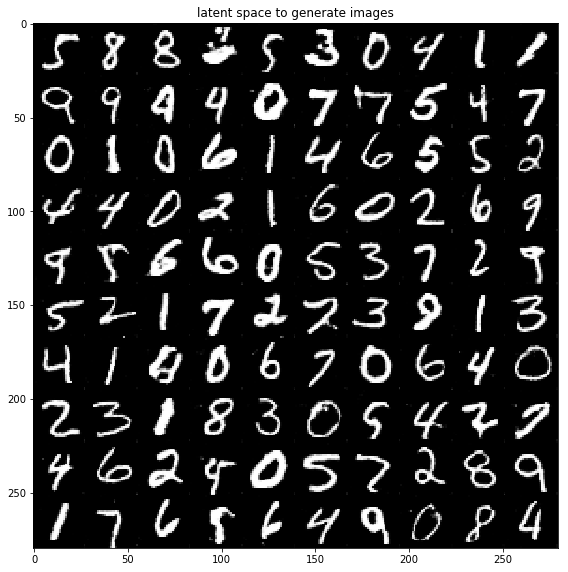

### Epoch 82, Step 0 ###
Current D_loss: 0.001586804399266839, Current G_loss: 3.1054372787475586, current_mutual: -4.738039016723633, current c loss: -4.739625930786133, curr d loss: 0.001586804399266839



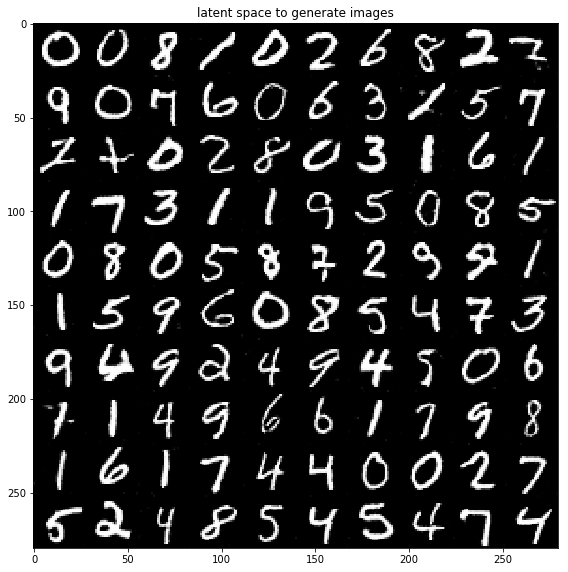

### Epoch 83, Step 0 ###
Current D_loss: 0.012152273207902908, Current G_loss: 2.5107696056365967, current_mutual: -5.017415523529053, current c loss: -5.029567718505859, curr d loss: 0.012152273207902908



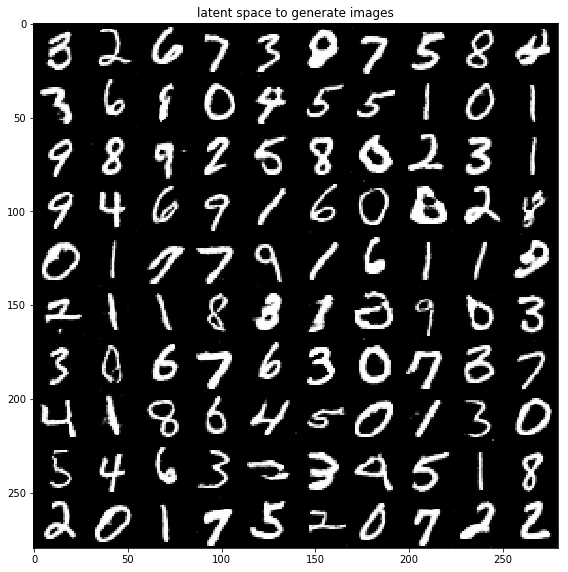

### Epoch 84, Step 0 ###
Current D_loss: 0.006336528807878494, Current G_loss: 3.0917487144470215, current_mutual: -4.843336582183838, current c loss: -4.849673271179199, curr d loss: 0.006336528807878494



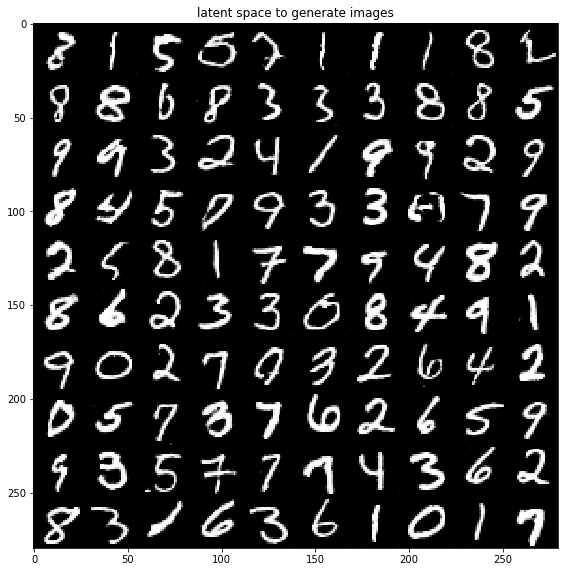

### Epoch 85, Step 0 ###
Current D_loss: 0.0012084905756637454, Current G_loss: 4.168051242828369, current_mutual: -3.9231669902801514, current c loss: -3.924375534057617, curr d loss: 0.0012084905756637454



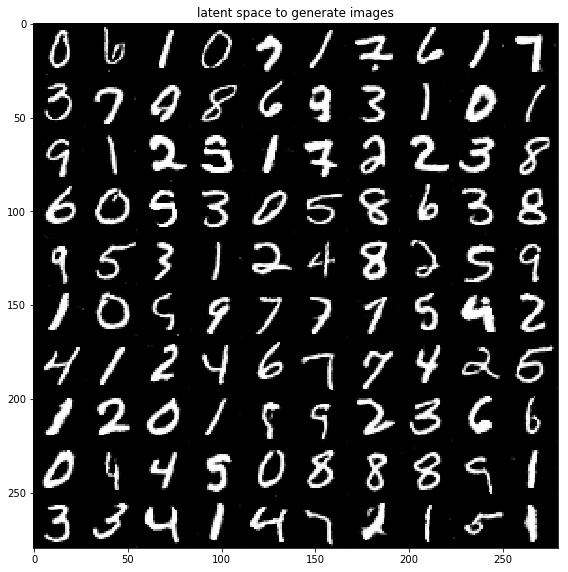

### Epoch 86, Step 0 ###
Current D_loss: 0.004077774006873369, Current G_loss: 2.1804120540618896, current_mutual: -3.7428436279296875, current c loss: -3.7469213008880615, curr d loss: 0.004077774006873369



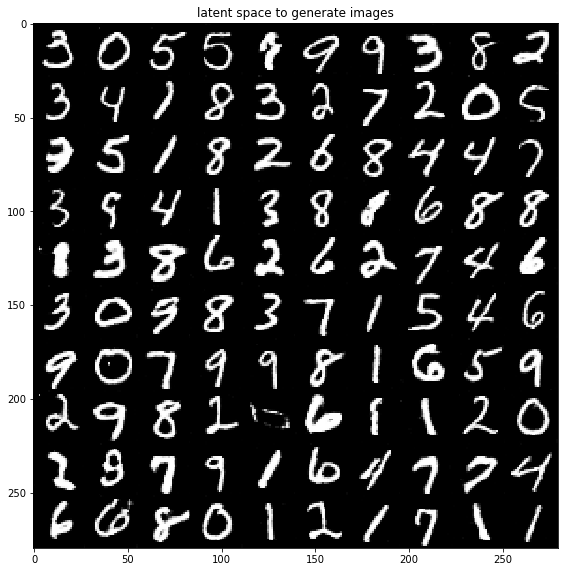

### Epoch 87, Step 0 ###
Current D_loss: 0.0071929460391402245, Current G_loss: 3.0873348712921143, current_mutual: -4.8029608726501465, current c loss: -4.810153961181641, curr d loss: 0.0071929460391402245



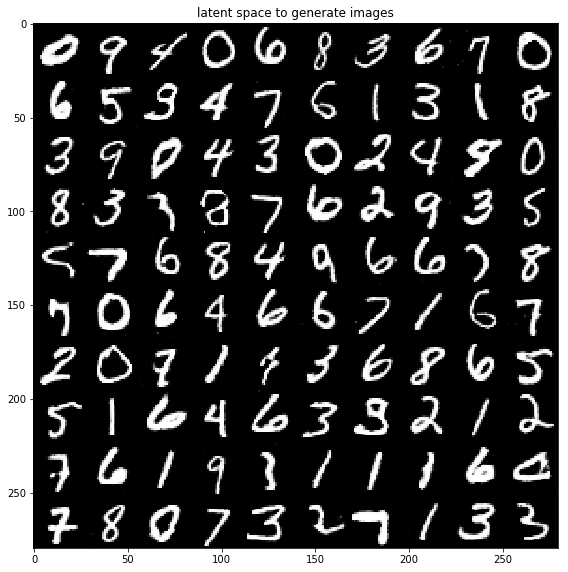

### Epoch 88, Step 0 ###
Current D_loss: 0.013287297450006008, Current G_loss: 3.64943790435791, current_mutual: -4.875070095062256, current c loss: -4.888357162475586, curr d loss: 0.013287297450006008



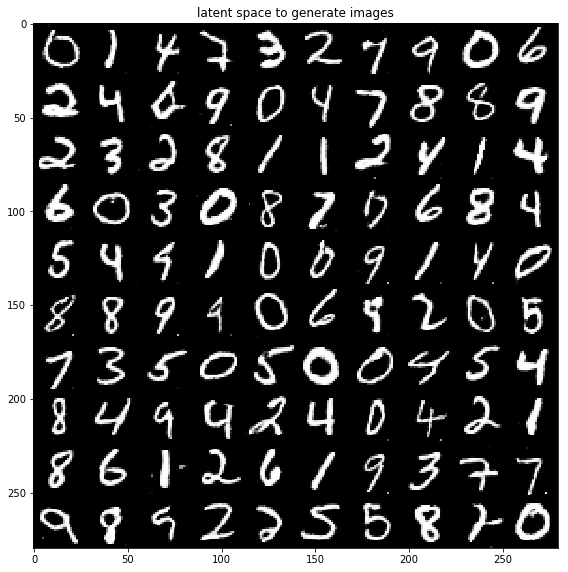

### Epoch 89, Step 0 ###
Current D_loss: 0.00575938681140542, Current G_loss: 3.1896181106567383, current_mutual: -4.497651100158691, current c loss: -4.503410339355469, curr d loss: 0.00575938681140542



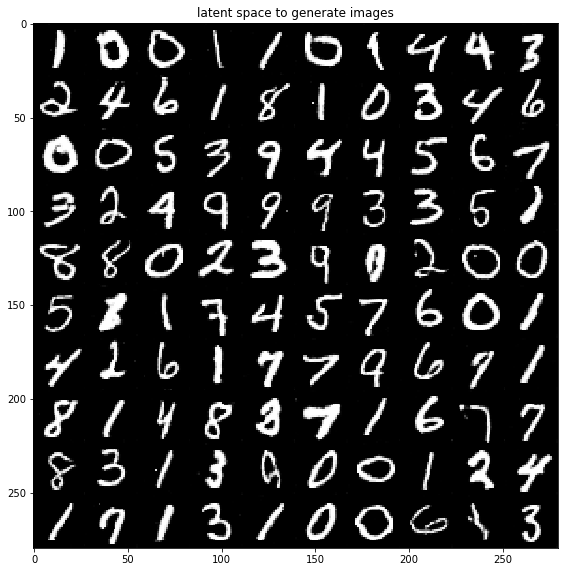

### Epoch 90, Step 0 ###
Current D_loss: 0.004478415474295616, Current G_loss: 3.346365451812744, current_mutual: -4.337557792663574, current c loss: -4.342036247253418, curr d loss: 0.004478415474295616



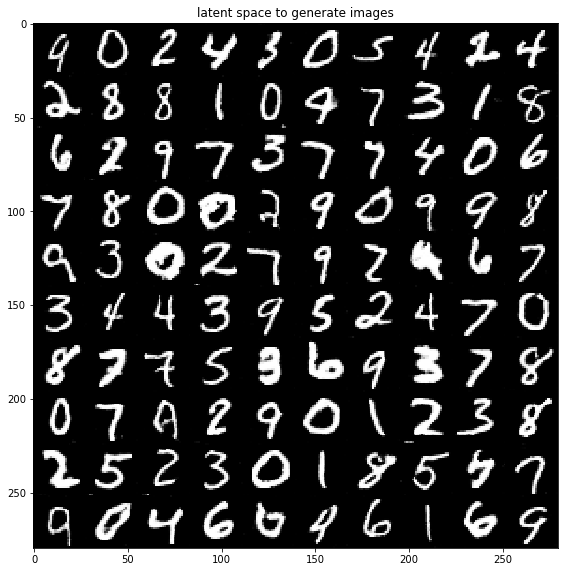

### Epoch 91, Step 0 ###
Current D_loss: 0.005669920239597559, Current G_loss: 3.5068671703338623, current_mutual: -4.393163681030273, current c loss: -4.398833751678467, curr d loss: 0.005669920239597559



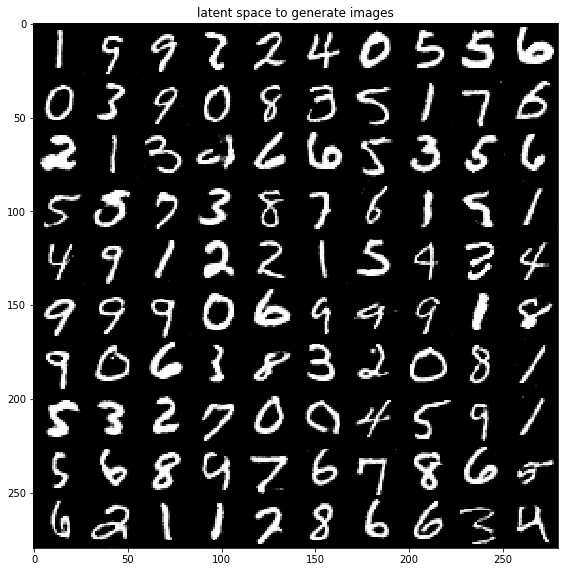

### Epoch 92, Step 0 ###
Current D_loss: 0.009454081766307354, Current G_loss: 3.664656639099121, current_mutual: -4.539182662963867, current c loss: -4.5486369132995605, curr d loss: 0.009454081766307354



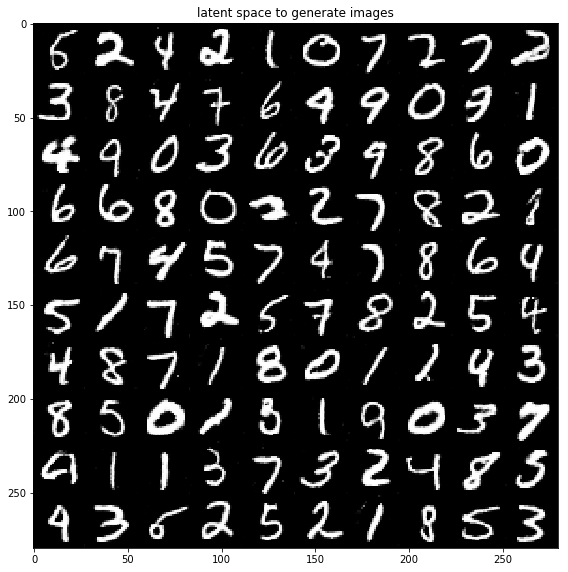

### Epoch 93, Step 0 ###
Current D_loss: 0.024019699543714523, Current G_loss: 2.804036855697632, current_mutual: -4.569049835205078, current c loss: -4.593069553375244, curr d loss: 0.024019699543714523



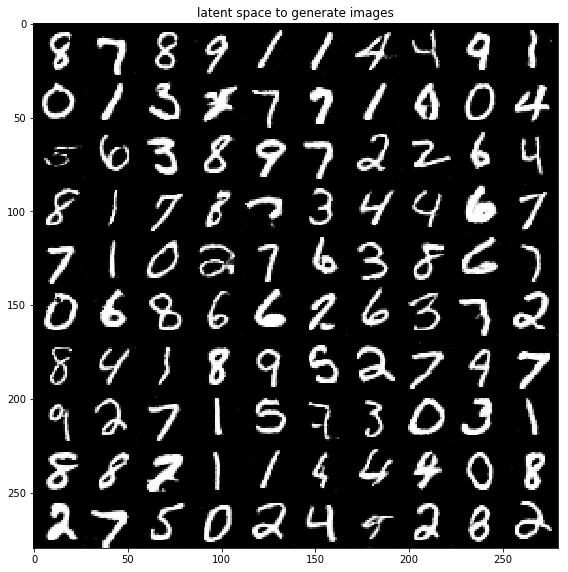

### Epoch 94, Step 0 ###
Current D_loss: 0.0031171885784715414, Current G_loss: 2.571735143661499, current_mutual: -4.31130838394165, current c loss: -4.314425468444824, curr d loss: 0.0031171885784715414



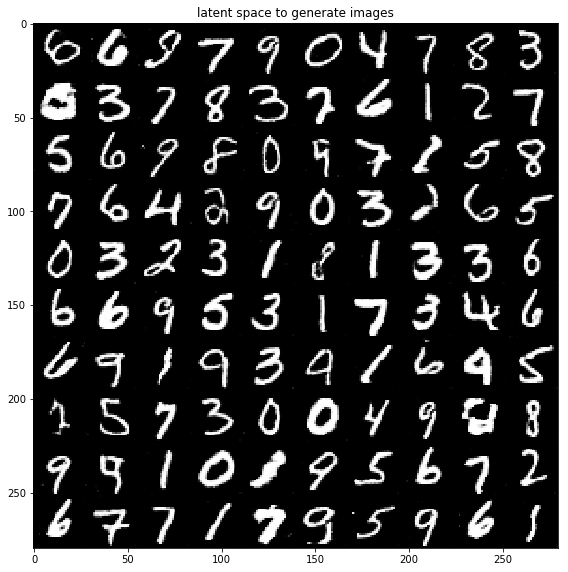

### Epoch 95, Step 0 ###
Current D_loss: 0.010424907319247723, Current G_loss: 3.7040069103240967, current_mutual: -4.512518405914307, current c loss: -4.522943496704102, curr d loss: 0.010424907319247723



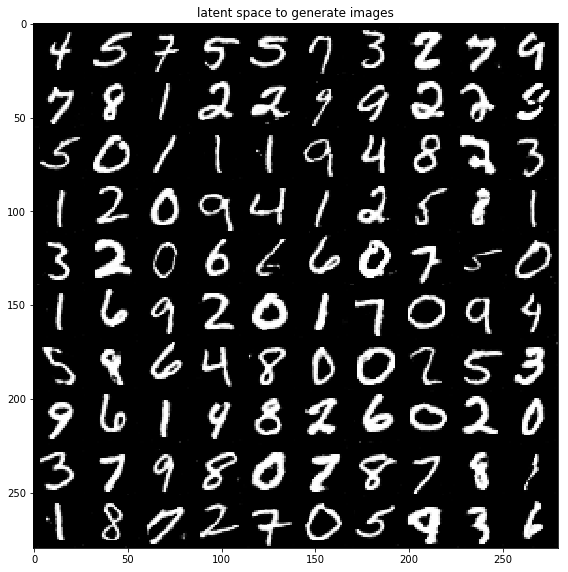

### Epoch 96, Step 0 ###
Current D_loss: 0.006272051949054003, Current G_loss: 3.3846590518951416, current_mutual: -5.007912635803223, current c loss: -5.014184474945068, curr d loss: 0.006272051949054003



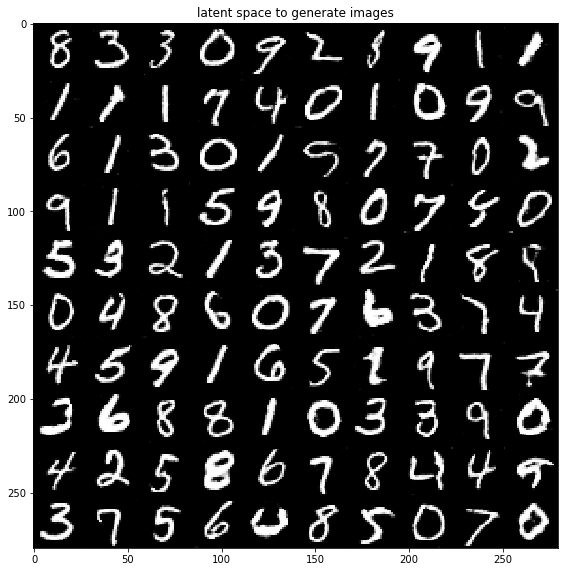

### Epoch 97, Step 0 ###
Current D_loss: 0.00853431411087513, Current G_loss: 2.2437167167663574, current_mutual: -5.023109436035156, current c loss: -5.031643867492676, curr d loss: 0.00853431411087513



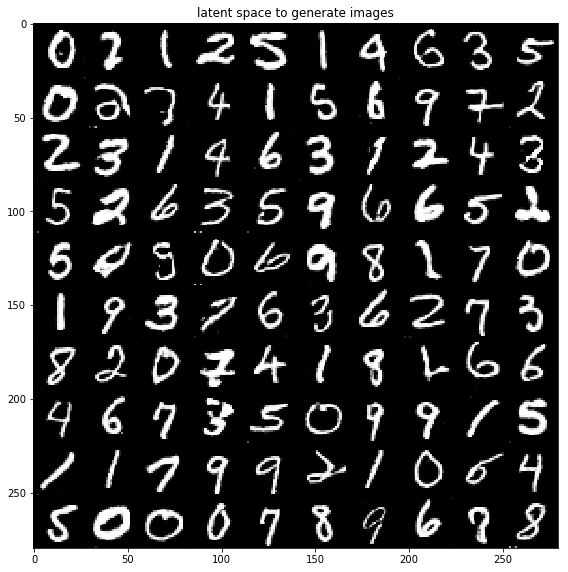

### Epoch 98, Step 0 ###
Current D_loss: 0.00592079758644104, Current G_loss: 3.3778514862060547, current_mutual: -4.056169033050537, current c loss: -4.062089920043945, curr d loss: 0.00592079758644104



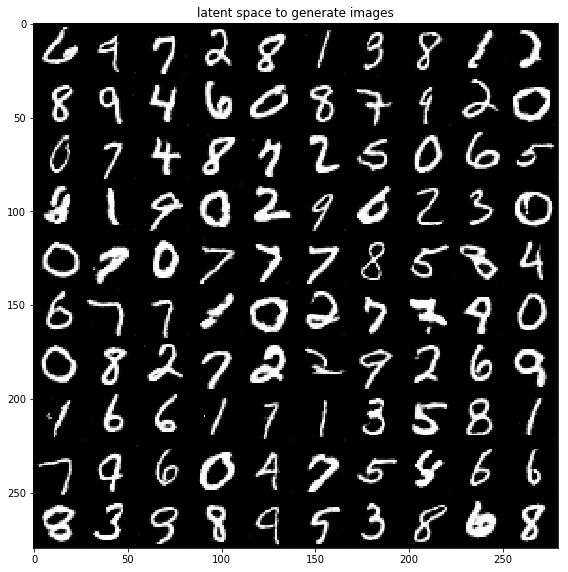

### Epoch 99, Step 0 ###
Current D_loss: 0.06668636947870255, Current G_loss: 3.382242202758789, current_mutual: -4.452386856079102, current c loss: -4.519073009490967, curr d loss: 0.06668636947870255



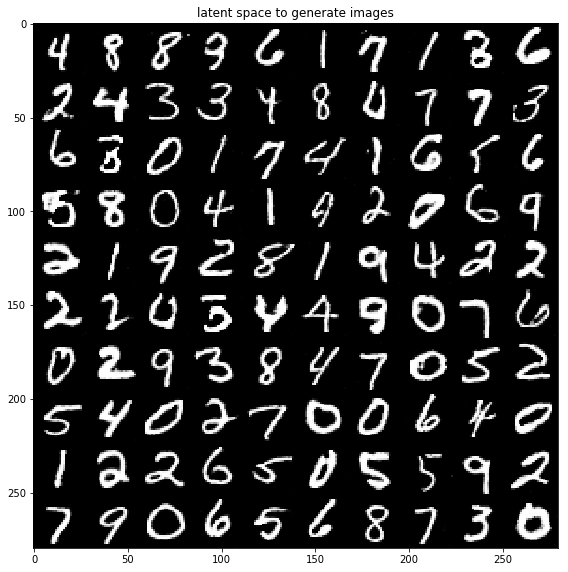

In [7]:
train(train_data,100)

In [4]:
def inference(path,z=None,c=None,d=None,size=100,reuse=True,name=''):
    if z is None:
        z,_,_=sample(size)
    if c is None:
        _,c,_=sample(size)
    if d is None:
        _,_,d=sample(size)
    m_i=InfoGan()
    g_img=m_i.Generator(reuse=reuse)
    saver=tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver.restore(sess,os.path.join(os.getcwd(),path))
        fake_image=sess.run(g_img,feed_dict={m_i.Z:z,m_i.C:c,m_i.D:d,m_i.is_training_g:False})
        canvas=np.empty((28*10,28*10))
        for xi in range(10):
            for yi in range(10):
                canvas[(xi)*28:(xi+1)*28,yi*28:(yi+1)*28]=fake_image[xi*10+yi].reshape(28,28)
        plt.figure(figsize=(8,10))
        plt.imshow(canvas,origin='upper',cmap='gray')
        plt.title('latent space to generate images '+name)
        plt.tight_layout()  
        plt.show()       

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_2.ckpt


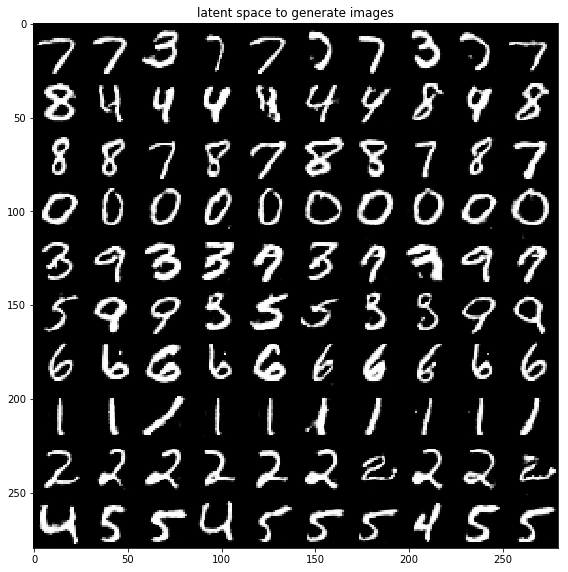

In [9]:
#2 - tanh D loss: D loss, G loss: G loss+mutual, Q loss: mutual epoch: 50
inference('InfoGan_model/InfoGan_2.ckpt',d=d,size=100)

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3.ckpt


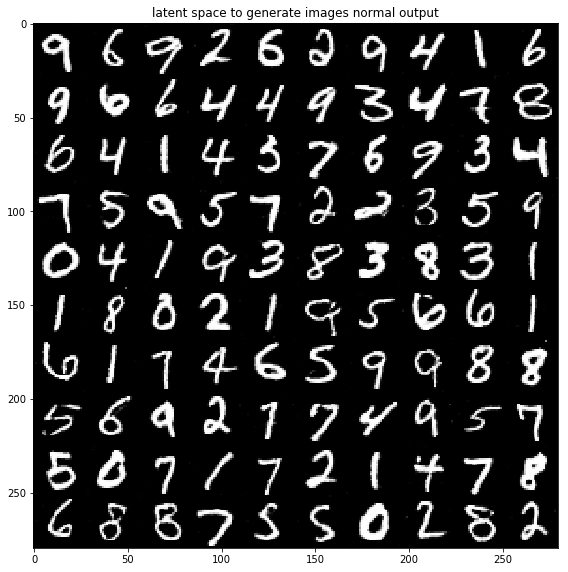

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3.ckpt


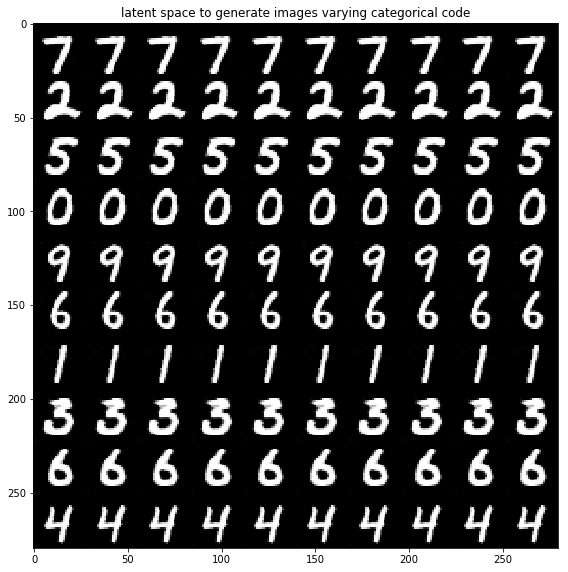

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3.ckpt


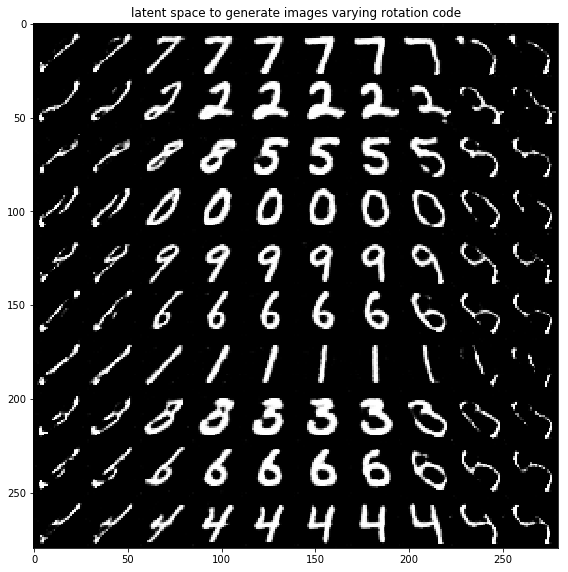

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3.ckpt


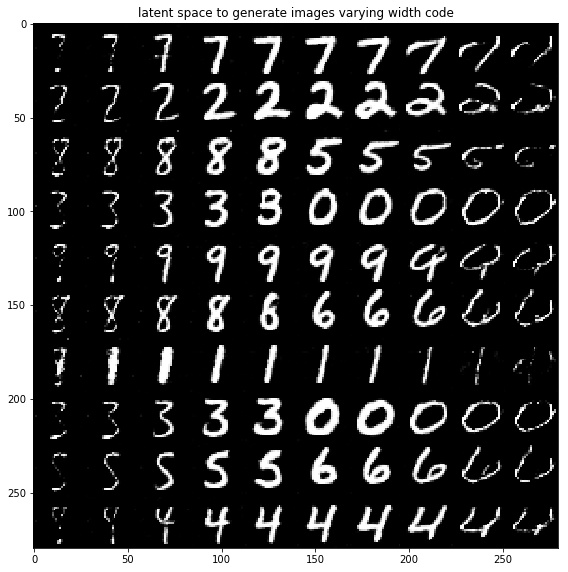

In [19]:
#3 - tanh D loss: D loss 2e-4, G loss: G loss 2e-4, Q loss: mutual 2e-4 - epoch: 100
inference('InfoGan_model/InfoGan_3.ckpt',size=100,name='normal output')
inference('InfoGan_model/InfoGan_3.ckpt',z=z,d=d,c=ct3,size=100,name='varying categorical code')
inference('InfoGan_model/InfoGan_3.ckpt',z=z,d=d,c=ct1,size=100,name='varying rotation code')
inference('InfoGan_model/InfoGan_3.ckpt',z=z,d=d,c=ct2,size=100,name='varying width code')

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3_withoutc.ckpt


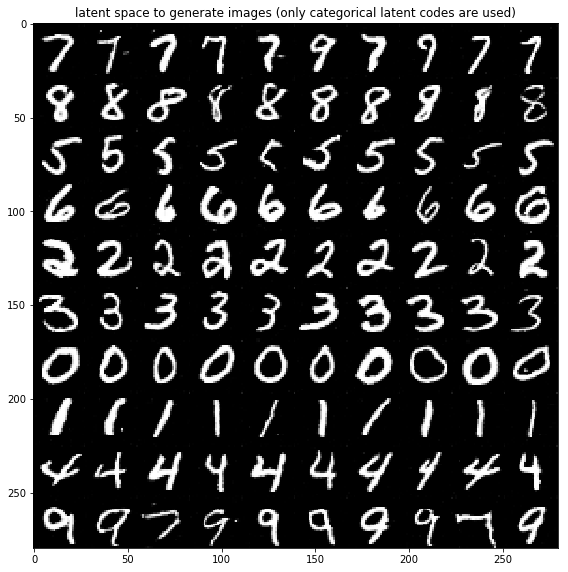

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3_withoutc.ckpt


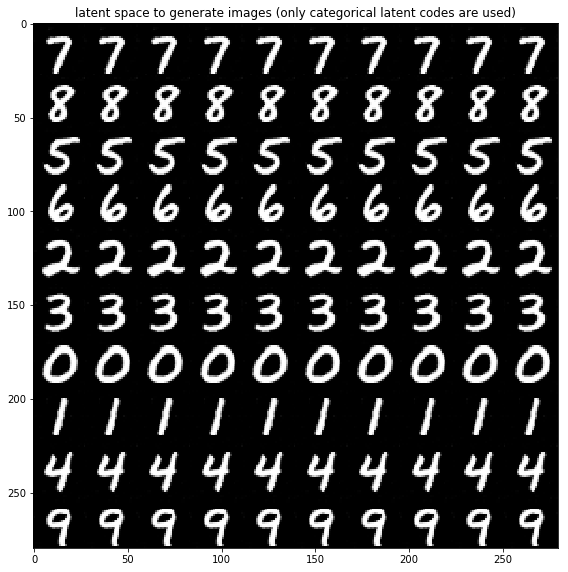

In [18]:
#Model: only categorical codes are used
inference('InfoGan_model/InfoGan_3_withoutc.ckpt',d=d,size=100,reuse=True)
inference('InfoGan_model/InfoGan_3_withoutc.ckpt',z=z,d=d,size=100,reuse=True)

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_4.ckpt


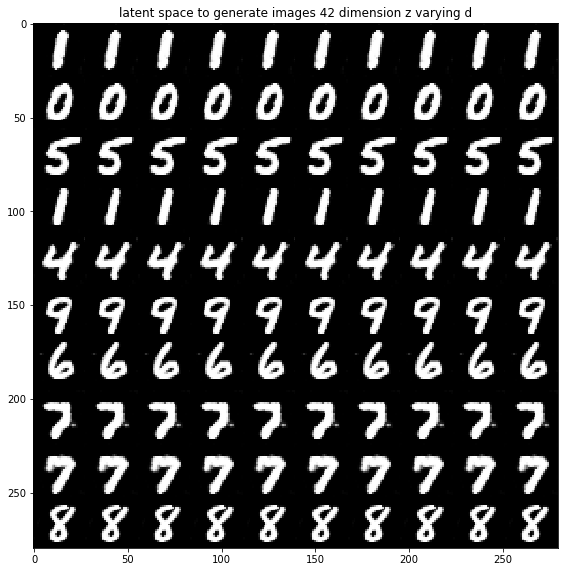

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_4.ckpt


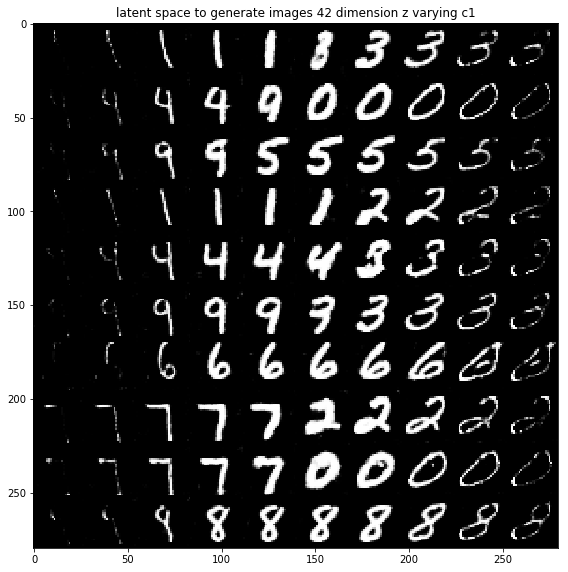

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_4.ckpt


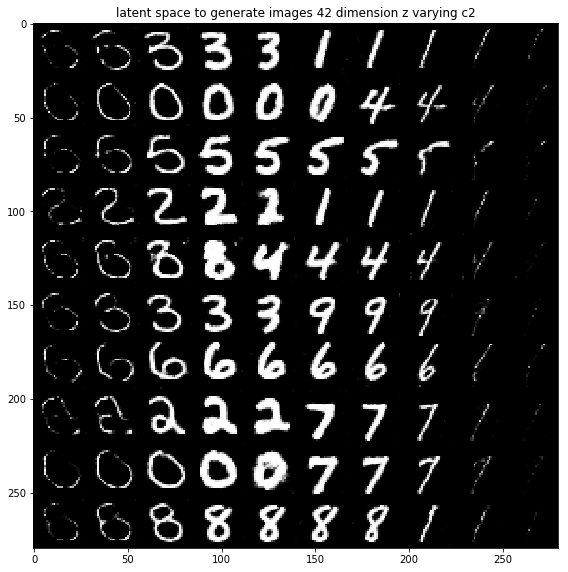

In [22]:
#Model: 42 dimension z. poor performance compared to 62 dimension z
inference('InfoGan_model/InfoGan_4.ckpt',d=d,c=ct3,z=z,name='42 dimension z varying d',reuse=True)
inference('InfoGan_model/InfoGan_4.ckpt',d=d,c=ct1,z=z,name='42 dimension z varying c1',reuse=True)
inference('InfoGan_model/InfoGan_4.ckpt',d=d,c=ct2,z=z,name='42 dimension z varying c2',reuse=True)

In [73]:
newlabel=[7,8,5,6,2,3,0,1,4,9]

In [23]:
d=np.zeros((100,10))
for i in range(10):
    d[i*10:(i+1)*10,i]=1
'''    
c_1=np.zeros((100,1))
c_2=np.linspace(-2,2,100)
c_2=np.reshape(c_2,(100,1))
c1=np.hstack((c_2,c_1))
c2=np.hstack((c_1,c_2))
c3=np.zeros((100,2))
'''
ct_=np.linspace(-2,2,10)
ct_1=np.zeros((10,10))
ct_1[:]=ct_
ct_1=ct_1.reshape(100,1)
ct_2=np.zeros((100,1))
ct1=np.hstack((ct_1,ct_2))
ct2=np.hstack((ct_2,ct_1))
ct3=np.zeros((100,2))
z=np.zeros((100,62))
dt=np.zeros((100,10))
dt=np.reshape(dt,(10,10,10))
for i in range(10):
    dt[:,i,i]=i
dt=np.reshape(dt,(100,10))

In [81]:
def predict(path,x,labels,label_dict,reuse):
    p_i=InfoGan()
    _,y_pre=p_i.Discriminator(p_i.X,reuse=reuse)
    y_hat=tf.argmax(y_pre,1)
    saver=tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver.restore(sess,os.path.join(os.getcwd(),path))
        y_=sess.run(y_hat,{p_i.X:x,p_i.is_training_d:False})  
    y_pred=np.array([label_dict[i] for i in y_])
    label=np.reshape(labels,(-1))
    acc=np.mean(y_pred==label)
    print('### accuracy ###\n',acc)
    return y_pred

In [82]:
#use model with only categorical codes to classify the images. Accuracy: ~90%
y_=predict('InfoGan_model/InfoGan_3_withoutc.ckpt',train_data[900:1000],label[900:1000],newlabel,reuse=True)

INFO:tensorflow:Restoring parameters from C:\Users\jiema\Documents\多动手\InfoGan_model/InfoGan_3_withoutc.ckpt
### accuracy ###
 0.92
